# Problem Statement
 

In the telecom industry:

    1. Annual churn rate is 15-25% .
    2. It costs 5-10 times more to acquire a new customer than retaining one.
    3. Two main models of payment are Postpaid and Prepaid

Thus for many incumbent operators, retaining high profitable customers is the number one business goal and to reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

 
# Case study Objective
In this project, we will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

#### Before we move ahead with modeling ,let us define what different types of churn are and which type would be our focus .

     1.Revenue based churn- Where a customer has not utilized any revenue generating facilities e.g.calls or mobile internet
                           -This is flawed because user could be a non-wage earning .
     2.Usage based churn- Where customer has not done any usage either incoming or outgoing calls ,internet
                         - This is flawed since if the customer has not used services he/she might have already churned.
#### Our focus for this exercise would be on usage based churn and on high value churn i.e. from where 80% of revenue comes

# Solution Approach
**1. Descriptive Statistics<br>**
**2. Data Cleaning**
    - Data Type conversion
    - Missing Value treatment
**3. Filter High Value Customers**<br>
**4. Tag churned and non churned customers<br>**
**5. Data Pre-processing**
    - Outlier Treatment
    - Multi-collinearity handling
    - Deriving new features
**6. Exploratory Data Analysis (EDA)<br>**
    - Univariate Analysis
    - Bivariate Analysis
**7. Data Standardizaion<br>**
**8. Modelling and Model Evaluation**
    - PCA
    - High Performance models with PCA
        - Logistic Regression
        - Random Forest
        - XG Boost
    - Interpretable models without PCA
        - Random Forest
**9. Model Evaluation Summary<br>**
**10 Recommendations to prevent customer churn**

# Solution

In [1]:
# Importing basic libraries and setting display options
#Importing the dataset 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

#import statsmodels.api as sm
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import RFE

from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score, roc_curve, roc_auc_score

# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
#pd.set_option('display.width', 1000)

In [5]:

teldata = pd.read_csv(r'telecom_churn_data.csv')
teldata.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

### Descriptive Statistics

In [6]:
#Head() to understand the dataset layout and columns
teldata.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [7]:
teldata.shape

(99999, 226)

In [8]:
#info() to get additional dataset details
teldata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [9]:
teldata.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

## Data Cleaning

### Data Type Conversion

In [10]:
teldata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


Date columns are captured as objects. Lets change their data types

In [11]:
teldata.select_dtypes(include=["object"]).head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9
0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/21/2014,7/16/2014,8/8/2014,9/28/2014,6/21/2014,7/16/2014,8/8/2014,NaN
1,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/29/2014,7/31/2014,8/28/2014,9/30/2014,NaN,7/25/2014,8/10/2014,NaN
2,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/17/2014,7/24/2014,8/14/2014,9/29/2014,NaN,NaN,NaN,9/17/2014
3,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/28/2014,7/31/2014,8/31/2014,9/30/2014,NaN,NaN,NaN,NaN
4,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/26/2014,7/28/2014,8/9/2014,9/28/2014,6/4/2014,NaN,NaN,NaN


In [12]:
dateColumns = list(teldata.select_dtypes(include=["object"]))
dateColumns

['last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'last_date_of_month_9',
 'date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_9',
 'date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8',
 'date_of_last_rech_data_9']

In [13]:
teldata[dateColumns] = pd.to_datetime(teldata[dateColumns].stack()).unstack()
teldata[dateColumns].dtypes

last_date_of_month_6        datetime64[ns]
last_date_of_month_7        datetime64[ns]
last_date_of_month_8        datetime64[ns]
last_date_of_month_9        datetime64[ns]
date_of_last_rech_6         datetime64[ns]
date_of_last_rech_7         datetime64[ns]
date_of_last_rech_8         datetime64[ns]
date_of_last_rech_9         datetime64[ns]
date_of_last_rech_data_6    datetime64[ns]
date_of_last_rech_data_7    datetime64[ns]
date_of_last_rech_data_8    datetime64[ns]
date_of_last_rech_data_9    datetime64[ns]
dtype: object

In [14]:
#Integer columns looks fine and needs no datatype conversion
teldata.select_dtypes(include=["int64"]).head()

,mobile_number,circle_id,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon
0,7000842753,109,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968
1,7001865778,109,4,9,11,5,74,384,283,121,44,154,65,50,44,23,30,0,0,1,0,0,0,0,2,0,0,0,0,0,0,0,0,0,1006
2,7001625959,109,5,4,2,7,168,315,116,358,86,200,86,100,0,200,86,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1103
3,7001204172,109,10,11,18,14,230,310,601,410,60,50,50,50,30,50,50,30,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2491
4,7000142493,109,5,6,3,4,196,350,287,200,56,110,110,50,50,110,110,50,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1526


In [15]:
#Float columns also looks fine and needs no datatype conversion
teldata.select_dtypes(include=["float64"]).head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,0.0,0.0,0.0,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,30.4,0.0,101.20,3.58
1,0.0,0.0,0.0,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.00,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.00,0.0,0.0,0.0,40.31,178.53,312.44,72.11,1.61,29.91,29.23,116.09,17.48,65.38,375.58,56.93,0.00,8.93,3.61,0.00,19.09,104.23,408.43,173.03,0.00,0.00,2.35,0.00,5.90,0.00,12.49,15.01,0.00,0.00,0.00,0.00,0.0,0.

### Missing Value Treatment

In [16]:
#To check for null values in the data set
teldata.isna().sum()

mobile_number                   0
circle_id                       0
loc_og_t2o_mou               1018
std_og_t2o_mou               1018
loc_ic_t2o_mou               1018
last_date_of_month_6            0
last_date_of_month_7          601
last_date_of_month_8         1100
last_date_of_month_9         1659
arpu_6                          0
arpu_7                          0
arpu_8                          0
arpu_9                          0
onnet_mou_6                  3937
onnet_mou_7                  3859
onnet_mou_8                  5378
onnet_mou_9                  7745
offnet_mou_6                 3937
offnet_mou_7                 3859
offnet_mou_8                 5378
offnet_mou_9                 7745
roam_ic_mou_6                3937
roam_ic_mou_7                3859
roam_ic_mou_8                5378
roam_ic_mou_9                7745
roam_og_mou_6                3937
roam_og_mou_7                3859
roam_og_mou_8                5378
roam_og_mou_9                7745
loc_og_t2t_mou

In [17]:
percent_missing  = round(100*(teldata.isnull().sum()/len(teldata.index)), 2)
percent_missing

mobile_number                0.00
circle_id                    0.00
loc_og_t2o_mou               1.02
std_og_t2o_mou               1.02
loc_ic_t2o_mou               1.02
last_date_of_month_6         0.00
last_date_of_month_7         0.60
last_date_of_month_8         1.10
last_date_of_month_9         1.66
arpu_6                       0.00
arpu_7                       0.00
arpu_8                       0.00
arpu_9                       0.00
onnet_mou_6                  3.94
onnet_mou_7                  3.86
onnet_mou_8                  5.38
onnet_mou_9                  7.75
offnet_mou_6                 3.94
offnet_mou_7                 3.86
offnet_mou_8                 5.38
offnet_mou_9                 7.75
roam_ic_mou_6                3.94
roam_ic_mou_7                3.86
roam_ic_mou_8                5.38
roam_ic_mou_9                7.75
roam_og_mou_6                3.94
roam_og_mou_7                3.86
roam_og_mou_8                5.38
roam_og_mou_9                7.75
loc_og_t2t_mou

In [18]:
# We see a few very important business columns which have high number of missing values.
#Lets impute them first with 0:
teldata["av_rech_amt_data_6"] = teldata["av_rech_amt_data_6"].fillna(0)
teldata['total_rech_data_6'] = teldata['total_rech_data_6'].fillna(0)
teldata["av_rech_amt_data_7"] = teldata["av_rech_amt_data_7"].fillna(0)
teldata['total_rech_data_7'] = teldata['total_rech_data_7'].fillna(0)
teldata["av_rech_amt_data_8"] = teldata["av_rech_amt_data_8"].fillna(0)
teldata['total_rech_data_8'] = teldata['total_rech_data_8'].fillna(0)
teldata["av_rech_amt_data_9"] = teldata["av_rech_amt_data_9"].fillna(0)
teldata['total_rech_data_9'] = teldata['total_rech_data_9'].fillna(0)
teldata["total_rech_amt_6"] = teldata["total_rech_amt_6"].fillna(0)
teldata['total_rech_amt_7'] = teldata['total_rech_amt_7'].fillna(0)
teldata['arpu_2g_6'] = teldata['arpu_2g_6'].fillna(0)
teldata['arpu_2g_7'] = teldata['arpu_2g_7'].fillna(0)
teldata['arpu_2g_8'] = teldata['arpu_2g_8'].fillna(0)
teldata['arpu_2g_9'] = teldata['arpu_2g_9'].fillna(0)
teldata['arpu_3g_6'] = teldata['arpu_3g_6'].fillna(0)
teldata['arpu_3g_7'] = teldata['arpu_3g_7'].fillna(0)
teldata['arpu_3g_8'] = teldata['arpu_3g_8'].fillna(0)
teldata['arpu_3g_9'] = teldata['arpu_3g_9'].fillna(0)

In [19]:
#### Summing up the missing values (column-wise) and displaying fraction of NaNs in descending order
columns = teldata.columns
percent_missing  = round(100*(teldata.isnull().sum()/len(teldata.index)), 2)
percent_missingDF = pd.DataFrame({"column_name":columns, "percent_missing":percent_missing})
percent_missingDF = percent_missingDF[percent_missingDF["percent_missing"] >0]
percent_missingDF.sort_values(by=["percent_missing"], ascending=False, inplace=True)
percent_missingDF.reset_index(drop=True, inplace=True)
percent_missingDF

,column_name,percent_missing
0,max_rech_data_6,74.85
1,fb_user_6,74.85
2,count_rech_2g_6,74.85
3,date_of_last_rech_data_6,74.85
4,count_rech_3g_6,74.85
5,night_pck_user_6,74.85
6,count_rech_3g_7,74.43
7,fb_user_7,74.43
8,date_of_last_rech_data_7,74.43
9,count_rech_2g_7,74.43


In [20]:
#### Drop columns which have > 70% of data missing
percent_missingDF_cols = percent_missingDF[percent_missingDF.percent_missing > 70]["column_name"]
percent_missingDF_cols = percent_missingDF_cols.tolist()
percent_missingDF_cols

['max_rech_data_6',
 'fb_user_6',
 'count_rech_2g_6',
 'date_of_last_rech_data_6',
 'count_rech_3g_6',
 'night_pck_user_6',
 'count_rech_3g_7',
 'fb_user_7',
 'date_of_last_rech_data_7',
 'count_rech_2g_7',
 'night_pck_user_7',
 'max_rech_data_7',
 'date_of_last_rech_data_9',
 'count_rech_3g_9',
 'fb_user_9',
 'count_rech_2g_9',
 'max_rech_data_9',
 'night_pck_user_9',
 'count_rech_2g_8',
 'night_pck_user_8',
 'count_rech_3g_8',
 'fb_user_8',
 'date_of_last_rech_data_8',
 'max_rech_data_8']

**None of the columns mentioned above looks to be of business importance. For e.g**
- Date of recharge - It may not help in churn prediction
- Count of recharge 2g and 3g - It may not help in churn prediction
- Night prepaid - It may not help in churn prediction
- FB user - It may not help in churn prediction

In [21]:
teldata.drop(percent_missingDF_cols, axis=1, inplace=True)
teldata.shape

(99999, 202)

In [22]:
columns = teldata.columns
percent_missing1 = round(100*(teldata.isnull().sum()/len(teldata.index)), 2)
percent_missingDF = pd.DataFrame({"column_name":columns, "percent_missing":percent_missing1})
percent_missingDF = percent_missingDF[percent_missingDF["percent_missing"] >0]
percent_missingDF.sort_values(by=["percent_missing"], ascending=False, inplace=True)
percent_missingDF.reset_index(drop=True, inplace=True)
percent_missingDF

,column_name,percent_missing
0,loc_og_t2f_mou_9,7.75
1,loc_og_t2t_mou_9,7.75
2,std_ic_t2o_mou_9,7.75
3,loc_og_mou_9,7.75
4,roam_og_mou_9,7.75
5,loc_ic_t2f_mou_9,7.75
6,spl_ic_mou_9,7.75
7,std_og_t2f_mou_9,7.75
8,og_others_9,7.75
9,roam_ic_mou_9,7.75


In [23]:
# We have decided to proceed with replacing missing values with the median value 
#as we do see many outliers and mean would not be a logical replacement 
teldata.fillna(teldata.median(),inplace=True)

In [24]:
#Checking for missing values ,we notice that we are left with additional date columns and it would better off to drop them
columns = teldata.columns
percent_missing  = round(100*(teldata.isnull().sum()/len(teldata.index)), 2)
percent_missingDF = pd.DataFrame({"column_name":columns, "percent_missing":percent_missing})
percent_missingDF = percent_missingDF[percent_missingDF["percent_missing"] >0]
percent_missingDF.sort_values(by=["percent_missing"], ascending=False, inplace=True)
percent_missingDF.reset_index(drop=True, inplace=True)
percent_missingDF

,column_name,percent_missing
0,date_of_last_rech_9,4.76
1,date_of_last_rech_8,3.62
2,date_of_last_rech_7,1.77
3,last_date_of_month_9,1.66
4,date_of_last_rech_6,1.61
5,last_date_of_month_8,1.10
6,last_date_of_month_7,0.60


In [25]:
#Dropping the date columns for month 6, 7 and 8 as they are not required for modelling
teldata.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','last_date_of_month_7','last_date_of_month_8'],axis=1,inplace=True)

In [26]:
#Now we are down to 134 columns
teldata.shape

(99999, 197)

### Filter High Value Customers

**For this case study, we will predict churn only for the high-value customers. **<br>
Definition of high-value customers is ,those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months . 

In [27]:
# We already have the total recharge amount for mobile recharges, let see how can we get total recharge amount for data.
total_rech_Cols = [col for col in teldata.columns if '_rech_' in col]
total_rech_Cols

['total_rech_num_6',
 'total_rech_num_7',
 'total_rech_num_8',
 'total_rech_num_9',
 'total_rech_amt_6',
 'total_rech_amt_7',
 'total_rech_amt_8',
 'total_rech_amt_9',
 'max_rech_amt_6',
 'max_rech_amt_7',
 'max_rech_amt_8',
 'max_rech_amt_9',
 'date_of_last_rech_9',
 'total_rech_data_6',
 'total_rech_data_7',
 'total_rech_data_8',
 'total_rech_data_9',
 'av_rech_amt_data_6',
 'av_rech_amt_data_7',
 'av_rech_amt_data_8',
 'av_rech_amt_data_9']

In [28]:
#Understanding the general distribution of total recharge amount for month of June give by 'total_rech_amt_6'
teldata[total_rech_Cols].describe()

,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9
count,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,7.558806,7.700367,7.212912,6.893019,327.514615,322.962970,324.157122,303.345673,104.637486,104.752398,107.728207,101.943889,0.619726,0.681837,0.698517,0.632806,48.445409,51.393440,52.027022,49.961089
std,7.078405,7.070422,7.203753,7.096261,398.019701,408.114237,416.540455,404.588583,120.614894,124.523970,126.902505,125.375109,1.760541,1.924382,1.963417,1.669040,127.743863,132.629365,131.182609,127.804280
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,3.000000,3.000000,3.000000,109.000000,100.000000,90.000000,52.000000,30.000000,30.000000,30.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,6.000000,6.000000,5.000000,5.000000,230.000000,220.000000,225.000000,200.000000,110.000000,110.000000,98.000000,61.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,9.000000,10.000000,9.000000,9.000000,437.500000,428.000000,434.500000,415.000000,120.000000,128.000000,144.000000,144.000000,1.000000,1.000000,1.000000,1.000000,8.250000,17.000000,23.000000,17.000000
max,307.000000,138.000000,196.000000,131.000000,35190.000000,40335.000000,45320.000000,37235.000000,4010.000000,4010.000000,4449.000000,3399.000000,61.000000,54.000000,60.000000,84.000000,7546.000000,4365.000000,4076.000000,4061.000000


In [29]:
# Let's calculate total data recharge = average data recharge * total data recharge. 
# Since both these columns has high number of missing values lets use 0 for total amount calculation
teldata["total_rech_data_amnt_6"] = teldata["av_rech_amt_data_6"] * teldata['total_rech_data_6']
teldata["total_rech_data_amnt_7"] = teldata["av_rech_amt_data_7"] * teldata['total_rech_data_7']
teldata["total_rech_data_amnt_8"] = teldata["av_rech_amt_data_8"] * teldata['total_rech_data_8']
teldata["total_rech_data_amnt_9"] = teldata["av_rech_amt_data_9"] * teldata['total_rech_data_9']

#We get this figure by adding the recharges for the month of June and July and dividing by two to get the two month's average
teldata["av_rech_amt_av67"] = ((teldata["total_rech_data_amnt_6"] + teldata['total_rech_amt_6'].fillna(0))+
(teldata["total_rech_data_amnt_7"] + teldata['total_rech_amt_7'].fillna(0)))/2

In [30]:
#Finding the value of 'X' which is the 70th percentile of the average recharge amount in the first two months .
seventyPercentileAmt = np.percentile(teldata["av_rech_amt_av67"],70)
seventyPercentileAmt

478.0

**We see the the amount in the 70th percentile is Rs 478,hence all the values above to this needs to be taken for further processing and analysis**

In [31]:
#Extracting all the values satisfying this criteria 
teldata_high_value = teldata[teldata["av_rech_amt_av67"] >= seventyPercentileAmt]
teldata_high_value.shape

(30001, 202)

**We have total approximately 29.9k records as high value customers**

In [32]:
# Lets drop the columns for average data recharge amount and total data recharges since we have total data recharge amount.
teldata_high_value.drop(["av_rech_amt_data_6","total_rech_data_6","av_rech_amt_data_7","total_rech_data_7","av_rech_amt_data_8","total_rech_data_8","av_rech_amt_data_9","total_rech_data_9"], inplace=True, axis=1)

**Lets see the list of columns which have only 1 unique value**

In [33]:
singleValueCols = teldata_high_value.loc[:,teldata_high_value.apply(pd.Series.nunique) ==1]
singleValueCols.head()

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9
0,109,0.0,0.0,0.0,2014-06-30,2014-09-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,109,0.0,0.0,0.0,2014-06-30,2014-09-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,109,0.0,0.0,0.0,2014-06-30,2014-09-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21,109,0.0,0.0,0.0,2014-06-30,2014-09-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23,109,0.0,0.0,0.0,2014-06-30,2014-09-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Since the above mentioned columns are not adding any value, lets drop them**

In [34]:
teldata_high_value = teldata_high_value.loc[:,teldata_high_value.apply(pd.Series.nunique) !=1]
teldata_high_value.shape

(30001, 180)

### Tagging the churned customers (churn=1, else 0) based on the fourth month i.e: 
Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. The attributes you need to use to tag churners are:

     total_ic_mou_9
     total_og_mou_9
     vol_2g_mb_9
     vol_3g_mb_9

In [35]:
teldata_high_value[['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']].head()

,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9
0,0.00,0.00,0.00,0.00
7,0.00,0.00,0.00,0.00
8,34.91,142.18,0.00,0.00
21,252.61,1031.53,0.00,0.00
23,127.48,127.63,13.93,314.74


In [36]:
# This function tag customers as Churn or not based on Incoming, Outgoing and data usage on mobile.
def define_Churn(row):
    if row['total_ic_mou_9']==0 and row['total_og_mou_9']==0 and row['vol_2g_mb_9']==0 and row['vol_3g_mb_9']==0:
        val = 1
    else:
        val = 0
    return val

In [37]:
# Create the churn label based on churn phase data.
teldata_high_value['churn']= teldata_high_value.apply(define_Churn, axis=1)

In [38]:
teldata_high_value.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_data_amnt_6,total_rech_data_amnt_7,total_rech_data_amnt_8,total_rech_data_amnt_9,av_rech_amt_av67,churn
0,7000842753,197.385,214.816,213.803,21.100,34.31,32.33,0.00,29.84,96.31,91.735,0.00,87.29,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,11.91,11.61,0.00,11.26,41.03,40.43,0.00,39.12,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,65.11,63.685,0.00,61.84,0.00,0.00,0.00,0.00,3.95,3.635,0.00,2.50,0.00,0.00,0.00,0.00,11.64,11.09,0.00,8.41,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,15.69,15.74,0.16,15.66,56.49,57.08,4.13,56.61,0.88,0.93,1.15,0.96,92.16,92.55,5.44,91.64,0.00,0.00,0.00,0.00,2.03,2.04,0.00,1.74,0.00,0.00,0.00,0.0,5.89,5.96,0.00,5.38,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,4,3,2,6,362,252,252,0,252,252,252,0,2014-09-28,252,252,252,0,30.13,1.32,5.75,0.00,83.57,150.76,109.61,0.00,212.17,212.17,212.17,0.00,212.17,212.17,212.17,0.00,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.40,0.00,101.20,3.58,252.0,252.0,252.0,0.0,559.0,1
7,7000701601,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,29.84,453.43,567.160,325.91,87.29,16.23,33.49,31.64,0.0,23.74,12.59,38.06,0.0,51.39,31.38,40.28,11.26,308.63,447.38,162.28,39.12,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.00,422.16,533.910,255.79,61.84,4.30,23.29,12.01,0.00,49.89,31.760,49.14,2.50,6.66,20.08,16.68,0.00,60.86,75.14,77.84,8.41,0.0,0.18,10.01,0.0,4.5,0.0,6.50,0.00,0.0,0.0,0.0,0.0,487.53,609.24,350.16,0.00,58.14,32.26,27.31,15.66,217.56,221.49,121.19,56.61,152.16,101.46,39.53,0.96,427.8

In [39]:
# Since we have created the churn label, we do not need columns for churn phase. Lets get rid of them
_9cols = [col for col in teldata_high_value.columns if '_9' in col]
_9cols

['arpu_9',
 'onnet_mou_9',
 'offnet_mou_9',
 'roam_ic_mou_9',
 'roam_og_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_9',
 'loc_og_mou_9',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_9',
 'std_og_mou_9',
 'isd_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'total_og_mou_9',
 'loc_ic_t2t_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_ic_t2f_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_mou_9',
 'total_ic_mou_9',
 'spl_ic_mou_9',
 'isd_ic_mou_9',
 'ic_others_9',
 'total_rech_num_9',
 'total_rech_amt_9',
 'max_rech_amt_9',
 'date_of_last_rech_9',
 'last_day_rch_amt_9',
 'vol_2g_mb_9',
 'vol_3g_mb_9',
 'arpu_3g_9',
 'arpu_2g_9',
 'monthly_2g_9',
 'sachet_2g_9',
 'monthly_3g_9',
 'sachet_3g_9',
 'total_rech_data_amnt_9']

In [40]:
teldata_high_value = teldata_high_value.drop(_9cols, axis=1)
teldata_high_value.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_data_amnt_6,total_rech_data_amnt_7,total_rech_data_amnt_8,av_rech_amt_av67,churn
0,7000842753,197.385,214.816,213.803,34.31,32.33,0.00,96.31,91.735,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.91,11.61,0.00,41.03,40.43,0.00,0.00,0.00,0.00,0.0,0.0,0.00,65.11,63.685,0.00,0.00,0.00,0.00,3.95,3.635,0.00,0.00,0.00,0.00,11.64,11.09,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,15.69,15.74,0.16,56.49,57.08,4.13,0.88,0.93,1.15,92.16,92.55,5.44,0.00,0.00,0.00,2.03,2.04,0.00,0.00,0.00,0.00,5.89,5.96,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0,0,0,0,0,0,1,1,1,0,0,0,968,30.40,0.00,101.20,3.58,252.0,252.0,252.0,559.0,1
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.160,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.910,255.79,4.30,23.29,12.01,49.89,31.760,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.00,0.0,0.0,0.0,1185.0,1
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.630,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.180,63.04,116.56,133.43,22.58,13.69,10.040,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.00,356.00,0.03,0.00,750.95,11.94,0.00,0.00,19.83,0.00,0.00,0.

Text(0.5, 1.0, 'Churn Distribution')

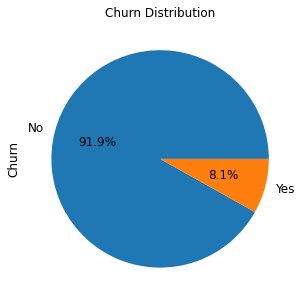

In [41]:
#Churn Distribution
ax = (teldata_high_value['churn'].value_counts()*100.0 /len(teldata_high_value)).plot.pie(autopct='%.1f%%', labels = ['No', 'Yes'],figsize =(5,5), fontsize = 12 )                                                                           

ax.set_ylabel('Churn',fontsize = 12)
ax.set_title('Churn Distribution', fontsize = 12)

In [42]:
teldata_high_value.shape

(30001, 137)

### MultiCollinearity handling

[]

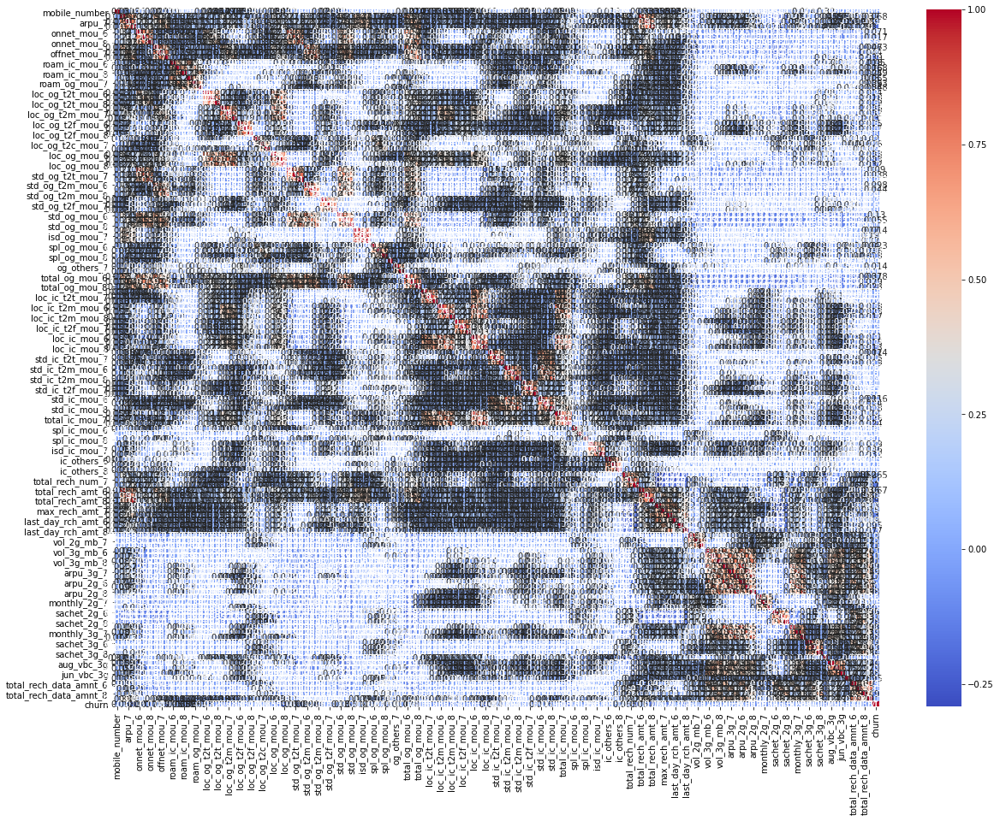

In [43]:
plt.figure(figsize=(20,15))
sns.heatmap(teldata_high_value.corr(), annot=True, cmap="coolwarm")
plt.plot()

**Though above graph is not readable but from color coding we observe that there is very high correlation between variables.**

In [44]:
corr = teldata_high_value.corr()
corr

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_data_amnt_6,total_rech_data_amnt_7,total_rech_data_amnt_8,av_rech_amt_av67,churn
mobile_number,1.000000,0.033944,0.029496,0.034570,0.010286,0.005789,0.007953,0.021943,0.012781,0.018982,0.010688,-0.002337,0.005051,0.005742,-0.001444,-0.002998,0.047584,0.045142,0.044270,0.079235,0.076262,0.079721,0.051706,0.052801,0.056261,-0.011992,-0.014402,-0.006246,0.084109,0.080975,0.081866,-0.016126,-0.019582,-0.015134,-0.024838,-0.028229,-0.024455,0.026098,0.018292,0.022105,-0.026933,-0.031717,-0.026000,-0.003305,-0.002934,-0.003759,-0.018397,-0.020731,-0.012834,-0.006493,-0.000901,0.000608,0.021971,0.013738,0.019837,0.032876,0.029859,0.033047,0.063011,0.057586,0.059869,0.054838,0.056564,0.054038,0.068790,0.064172,0.066116,-0.000983,0.003904,-0.000364,-0.010461,-0.011333,-0.013028,0.014938,0.012017,0.013809,-0.006063,-0.004447,-0.008102,0.059045,0.054462,0.055447,-0.023023,-0.002512,-0.029491,0.003290,0.001786,0.001339,0.013434,0.009293,0.009249,-0.028577,-0.042969,-0.036143,0.033132,0.032579,0.032562,0.058218,0.058546,0.063373,0.045361,0.051821,0.044710,-0.015438,-0.018346,-0.018737,-0.019905,-0.010386,-0.006439,0.002937,0.004162,0.009050,-0.001452,-0.000541,0.006829,0.008912,0.009545,0.007620,-0.042201,-0.041207,-0.032469,0.003566,0.005660,0.014425,-0.014893,-0.013193,-0.009693,0.315694,-0.032058,-0.028015,-0.037881,-0.007521,-0.018295,-0.018463,-0.007553,-0.005757,-0.030100
arpu_6,0.033944,1.000000,0.671732,0.612617,0.341782,0.216219,0.187305,0.508114,0.339951,0.287079,0.126884,0.083484,0.090363,0.196086,0.143261,0.124994,0.166776,0.127681,0.123995,0.330788,0.245394,0.219607,0.139434,0.114368,0.104302,0.047680,0.010017,0.011393,0.327499,0.246516,0.224799,0.274093,0.161528,0.133795,0.301481,0.181419,0.139826,0.066751,0.053564,0.043895,0.385695,0.230406,0.182159,0.466898,0.420753,0.413504,0.122743,0.068491,0.044582,0.054782,0.024347,0.015490,0.554510,0.363276,0.301856,0.081747,0.062923,0.063284,0.185927,0.149405,0.125890,0.051283,0.039198,0.037451,0.178888,0.142728,0.126146,0.088103,0.061598,0.056880,0.098536,0.065705,0.062957,0.034451,0.032583,0.022957,0.124639,0.085674,0.079524,0.225987,0.169024

In [45]:
corr.loc[:,:] = np.tril(corr,-1)
corr

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_data_amnt_6,total_rech_data_amnt_7,total_rech_data_amnt_8,av_rech_amt_av67,churn
mobile_number,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
arpu_6,0.033944,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

In [46]:
corr = corr.stack()
corr[(corr > 0.60) | (corr < -0.60)].sort_values()

roam_og_mou_8       roam_og_mou_7             0.601079
monthly_3g_6        vol_3g_mb_6               0.601308
arpu_2g_6           arpu_3g_7                 0.601974
total_ic_mou_7      loc_ic_t2t_mou_7          0.602134
std_ic_mou_6        std_ic_t2m_mou_7          0.603054
total_rech_amt_8    arpu_6                    0.603673
arpu_2g_7           arpu_3g_6                 0.604980
loc_og_mou_6        loc_og_t2t_mou_7          0.605884
std_ic_mou_7        std_ic_t2m_mou_8          0.606013
total_ic_mou_8      loc_ic_t2t_mou_8          0.606106
roam_ic_mou_8       roam_ic_mou_7             0.606110
aug_vbc_3g          vol_3g_mb_8               0.607689
arpu_3g_7           vol_3g_mb_8               0.607734
std_ic_t2m_mou_8    std_ic_t2m_mou_6          0.607739
std_og_t2m_mou_7    offnet_mou_6              0.608605
std_og_mou_7        std_og_t2t_mou_8          0.608715
total_rech_amt_8    total_rech_amt_6          0.609306
std_og_t2t_mou_8    std_og_t2t_mou_6          0.609653
total_rech

In [47]:
dropCorrelatedColsList = ["loc_og_t2m_mou_6", "loc_og_t2m_mou_7", "loc_og_t2m_mou_8", "std_og_t2t_mou_6", 
                         "std_og_t2t_mou_7", "std_og_t2t_mou_8", "std_og_t2m_mou_6", "std_og_t2m_mou_7",
                         "std_og_t2m_mou_8", "total_og_mou_6","total_og_mou_7",'total_og_mou_8',"loc_ic_t2t_mou_6",
                         "loc_ic_t2t_mou_7", "loc_ic_t2t_mou_8", "loc_ic_t2m_mou_6", "loc_ic_t2m_mou_7",
                         "loc_ic_t2m_mou_8", "std_ic_t2m_mou_6", "std_ic_t2m_mou_7", "std_ic_t2m_mou_8",
                         "total_ic_mou_6", "total_ic_mou_7", "total_ic_mou_8", "total_rech_amt_6", "total_rech_amt_7",
                         "total_rech_amt_8", "vol_3g_mb_6", "vol_3g_mb_7", "vol_3g_mb_8", "loc_og_t2t_mou_6",
                         "loc_og_t2t_mou_7", "loc_og_t2t_mou_8"]
teldata_high_value.drop(columns=dropCorrelatedColsList, axis=1, inplace=True)

[]

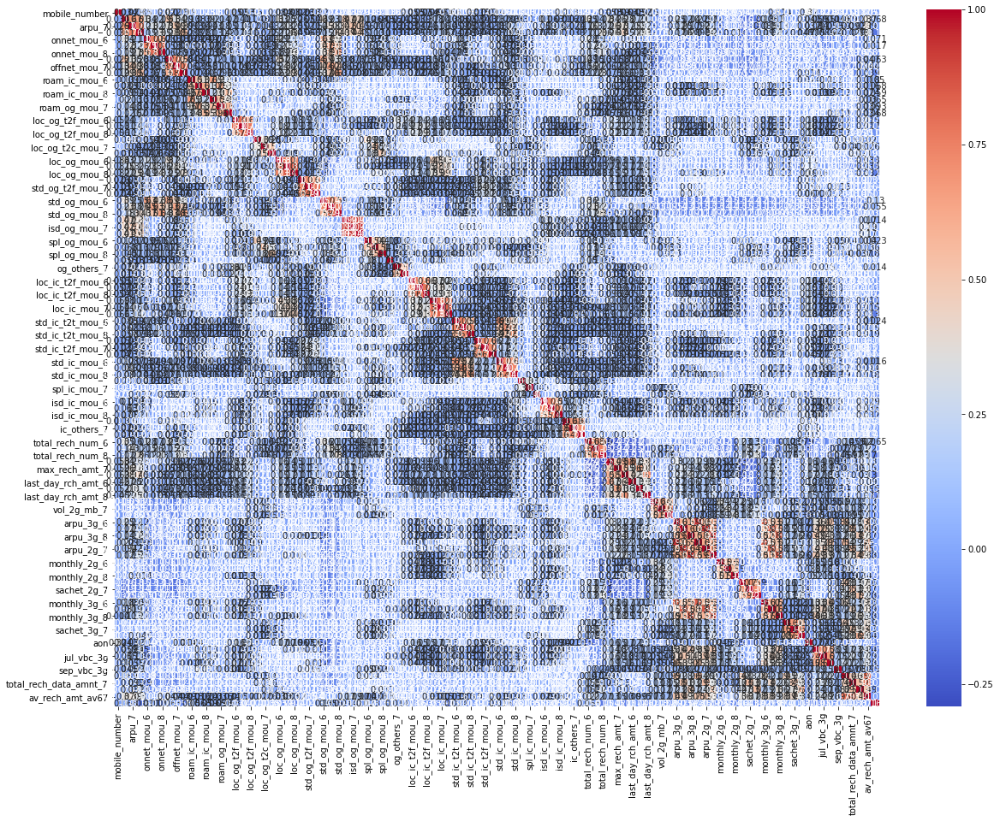

In [48]:
plt.figure(figsize=(20,15))
sns.heatmap(teldata_high_value.corr(), annot=True, cmap="coolwarm")
plt.plot()

**We removed columns which had correlation with other features as they were not adding any value. But we still have some multicollinearity which we will handle during modelling.**

In [49]:
teldata_high_value.shape

(30001, 104)

**Now we are left with 104 features from 226**

### Outlier Treatment

In [50]:
#Checking for outliers in data
teldata_high_value.describe(percentiles=[.7, .8,.9,.97,.99,.995,.999])

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_data_amnt_6,total_rech_data_amnt_7,total_rech_data_amnt_8,av_rech_amt_av67,churn
count,3.000100e+04,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000
mean,7.001206e+09,558.490824,560.782203,508.597957,261.416302,268.397982,235.378852,375.443534,379.745170,338.682670,16.110355,12.642504,12.500551,26.571547,20.152086,19.865615,6.344115,6.423683,5.886385,1.575104,1.889875,1.707746,255.263181,256.256216,238.222058,1.803548,1.826051,1.584734,347.337408,364.183012,307.786679,2.171525,2.105743,1.948970,5.818270,7.108646,6.557204,0.661092,0.042905,0.057607,15.294453,16.052212,14.439567,232.827960,235.964002,226.936437,14.894779,15.421504,13.913705,2.695855,2.798443,2.561970,46.896432,49.152794,44.631750,0.061035,0.019765,0.026567,10.784689,11.875796,10.998257,1.153449,1.500338,1.224455,11.851005,11.718843,9.972868,169.284824,172.201727,160.144462,100.893604,100.356021,92.393654,126.522185,125.097326,105.913072,67.007633,68.621327,62.773480,63.439374,64.701428,58.395301,0.174494,0.183261,0.153628,1.066064,1.214026,1.054865,0.217759,0.229026,0.211026,0.209393,0.227492,0.202393,1209.368754,169.138860,178.872765,158.523962,8.029788,455.777166,528.233732,463.252944,1152.620628,0.081364
std,6.908784e+05,460.640461,479.776947,501.961981,459.313442,479.690135,457.844464,481.338526,497.826193,479.882371,76.302156,75.785903,74.125281,116.205525,96.100428,104.71900

[]

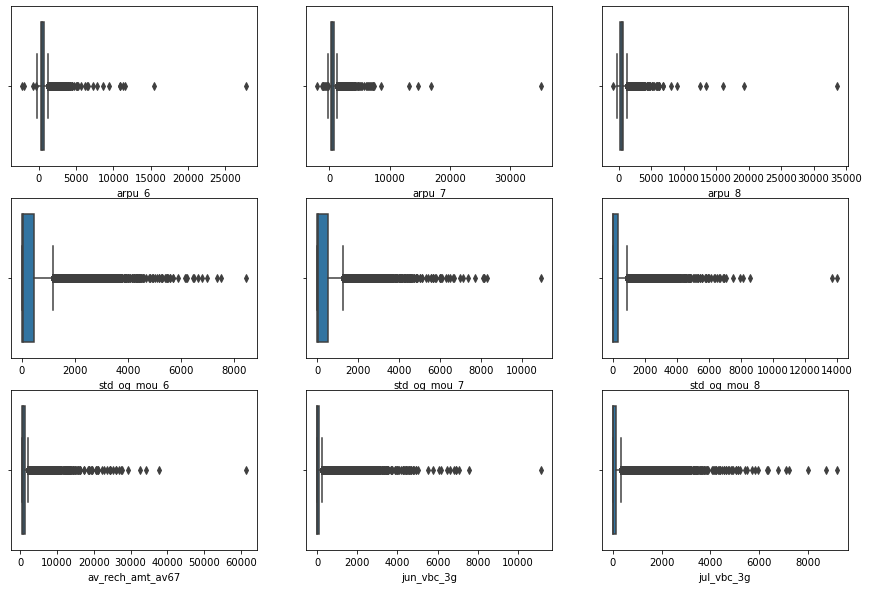

In [51]:
#Plotting before outlier treatment

plt.figure(figsize=(15,10))
plt.subplot(3,3 , 1)
sns.boxplot(teldata_high_value['arpu_6'])
plt.subplot(3,3 , 2)
sns.boxplot(teldata_high_value['arpu_7'])
plt.subplot(3,3 , 3)
sns.boxplot(teldata_high_value['arpu_8'])
plt.subplot(3,3 , 4)
sns.boxplot(teldata_high_value['std_og_mou_6'])
plt.subplot(3,3 , 5)
sns.boxplot(teldata_high_value['std_og_mou_7'])
plt.subplot(3,3 , 6)
sns.boxplot(teldata_high_value['std_og_mou_8'])
plt.subplot(3,3 , 7)
sns.boxplot(teldata_high_value['av_rech_amt_av67'])
plt.subplot(3,3 , 8)
sns.boxplot(teldata_high_value['jun_vbc_3g'])
plt.subplot(3,3 , 9)
sns.boxplot(teldata_high_value['jul_vbc_3g'])
plt.plot()

#### Even though we are trying to find churn in high value customers, we observe that there are extreme outliers present in the dataset. Hence we decided to remove datapoints which are outliers to outliers. 
#### For this we will cap datapoints to 99.9 percentile

In [52]:
#Checking data skewness
teldata_high_value.skew()

mobile_number               0.003195
arpu_6                     11.970653
arpu_7                     17.479168
arpu_8                     15.268867
onnet_mou_6                 4.042753
onnet_mou_7                 4.241548
onnet_mou_8                 5.072890
offnet_mou_6                3.420341
offnet_mou_7                3.657603
offnet_mou_8                5.052982
roam_ic_mou_6              11.522568
roam_ic_mou_7              17.316232
roam_ic_mou_8              18.677875
roam_og_mou_6               9.464554
roam_og_mou_7               9.389667
roam_og_mou_8              14.560651
loc_og_t2f_mou_6           18.051969
loc_og_t2f_mou_7           16.671534
loc_og_t2f_mou_8           12.714886
loc_og_t2c_mou_6           12.856312
loc_og_t2c_mou_7           25.560748
loc_og_t2c_mou_8           16.649234
loc_og_mou_6                4.507344
loc_og_mou_7                4.402935
loc_og_mou_8                5.358278
std_og_t2f_mou_6           17.488329
std_og_t2f_mou_7           18.299560
s

In [53]:
#Function to determine 99.9 percentile and cap the column value at that 
def outlierTreatment(colName):
    q_hi  = teldata_high_value[colName].quantile(0.999)
    teldata_high_value[colName] = np.where(teldata_high_value[colName] > q_hi,q_hi,teldata_high_value[colName])
    return teldata_high_value

In [54]:
#Applying the function to the dataset
outlierTreatment(teldata_high_value.columns.values)

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_data_amnt_6,total_rech_data_amnt_7,total_rech_data_amnt_8,av_rech_amt_av67,churn
0,7.000843e+09,197.385,214.816,213.803,34.31,32.33,0.00,96.31,91.735,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,65.11,63.685,0.00,0.00,0.00,0.00,11.64,11.09,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.88,0.93,1.15,92.16,92.55,5.44,0.00,0.00,0.00,0.00,0.00,0.00,5.89,5.96,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4.0,3.0,2.0,252.0,252.0,252.0,252.0,252.0,252.0,30.13,1.32,5.75,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,968.0,30.40,0.00,101.20,3.58,252.0,252.0,252.0,559.0,1.0
7,7.000702e+09,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.160,325.91,16.23,33.49,31.64,23.74,12.59,38.06,62.13,55.14,53.23,0.00,0.00,0.00,422.16,533.910,255.79,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,52.19,34.24,22.21,180.54,173.08,193.94,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5.0,5.0,7.0,1580.0,790.0,1580.0,0.0,0.0,779.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,802.0,57.74,19.38,18.74,0.00,0.0,0.0,0.0,1185.0,1.0
8,7.001525e+09,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.630,136.48,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.15,378.09,288.180,63.04,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,0.00,0.00,0.00,22.43,4.66,0.75,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19.0,21.0,14.0,90.0,154.0,30.0,50.0,0.0,10.0,0.00,356.00,0.03,0.00,0.00,19.83,0.00,0.00,0.00,0.0,1.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,315.0,21.03,910.65,122.16,0.00,0.0,354.0,207.0,696.0,0.0
21,7.002124e+09,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.680,983.39,0.00,0.00,0.00,0.00,0.00,0.00,0.75,0.00,1.58,0.00,0.00,0.00,97.04,94.090,129.74,0.00,0.00,0.00,763.29,934.69,938.79,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,4.61,2.84,10.39,125.33,87.68,159.11,14.06,5.98,0.18,0.00,0.00,0.00,81.76,44.21,101.93,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,22.0,26.0,27.0,50.0,50.0,50.0,30.0,20.0,50.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,720.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,640.0,0.0
23,7.000887e+09,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.360,205.89,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,17.71,131.91,133.680,182.14,0.00,0.00,0.00,2.36,6.35,39.61,0.0,0.01,0.00,0.10,0.00,17.71,0.00,0.0,0.0,0.00,0.00,0.71,116.63,174.41,224.21,0.51,0.00,13.38,0.00,0.00,0.00,2.94,14.89,57.29,

In [55]:
teldata_high_value.describe(percentiles=[.7, .8,.9,.97,.99,.999])

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_data_amnt_6,total_rech_data_amnt_7,total_rech_data_amnt_8,av_rech_amt_av67,churn
count,3.000100e+04,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000
mean,7.001206e+09,555.102524,557.357391,504.792961,260.368630,267.002112,233.725056,374.476881,378.787363,337.134369,15.655880,12.108263,11.919661,26.108360,19.835010,19.289419,6.191576,6.263598,5.767930,1.527418,1.786861,1.639950,254.183064,255.194224,236.904016,1.723820,1.713249,1.505709,346.361730,362.654752,306.187781,1.592736,1.535492,1.482631,5.691022,6.926070,6.422505,0.628235,0.011019,0.013703,15.011825,15.770707,14.172881,231.940689,235.218055,226.106634,14.139952,14.531482,13.218440,2.495348,2.565431,2.299095,45.934874,48.223970,43.747737,0.059991,0.017956,0.026311,10.245161,11.208650,10.515225,0.958812,1.319469,1.058539,11.821673,11.702910,9.952702,168.723909,171.760541,159.357588,100.238492,99.798573,91.062365,125.312462,124.141552,104.542592,66.232837,68.053818,62.198469,62.687206,64.100565,57.896593,0.174261,0.182961,0.153228,1.060731,1.208126,1.048432,0.215493,0.226692,0.209626,0.203560,0.222393,0.195260,1209.157261,167.672010,177.601546,157.269400,7.680132,444.889113,520.631377,449.222866,1144.780215,0.081364
std,6.908765e+05,394.251069,398.162195,418.385283,448.122852,464.295815,437.292939,471.697600,487.414968,458.275392,67.758532,62.967319,59.850565,108.329612,90.952451,91.799389,

Text(0.5, 1.0, 'Churn Distribution')

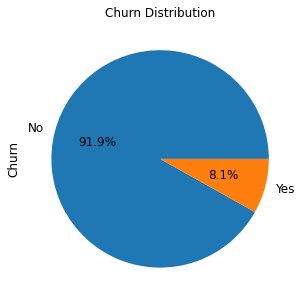

In [56]:
#We see that post outlier treatment the class breakup has not changed. Churn distribution has still no changed

ax = (teldata_high_value['churn'].value_counts()*100.0 /len(teldata_high_value)).plot.pie(autopct='%.1f%%', labels = ['No', 'Yes'],figsize =(5,5), fontsize = 12 )                                                                           

ax.set_ylabel('Churn',fontsize = 12)
ax.set_title('Churn Distribution', fontsize = 12)

In [57]:
#We noticed now that the skewness has been corrected to a large extent ~10 from a high of 100+ for many columns
#any further outlier treatment will result in information loss
teldata_high_value.skew()

mobile_number              0.003185
arpu_6                     2.412644
arpu_7                     2.525616
arpu_8                     2.322997
onnet_mou_6                3.518256
onnet_mou_7                3.518180
onnet_mou_8                3.872136
offnet_mou_6               2.994894
offnet_mou_7               3.157945
offnet_mou_8               3.424529
roam_ic_mou_6              7.689967
roam_ic_mou_7              9.654442
roam_ic_mou_8              9.182328
roam_og_mou_6              7.428119
roam_og_mou_7              8.046843
roam_og_mou_8              8.852004
loc_og_t2f_mou_6           6.973208
loc_og_t2f_mou_7           6.624382
loc_og_t2f_mou_8           6.757348
loc_og_t2c_mou_6           6.850106
loc_og_t2c_mou_7           7.452752
loc_og_t2c_mou_8           6.687764
loc_og_mou_6               3.442166
loc_og_mou_7               3.515440
loc_og_mou_8               3.384801
std_og_t2f_mou_6          11.376237
std_og_t2f_mou_7          11.554269
std_og_t2f_mou_8          11

#### We noticed that the data is now completly cleaned and extreme outliers capped 

In [58]:
teldata_high_value.shape

(30001, 104)

[]

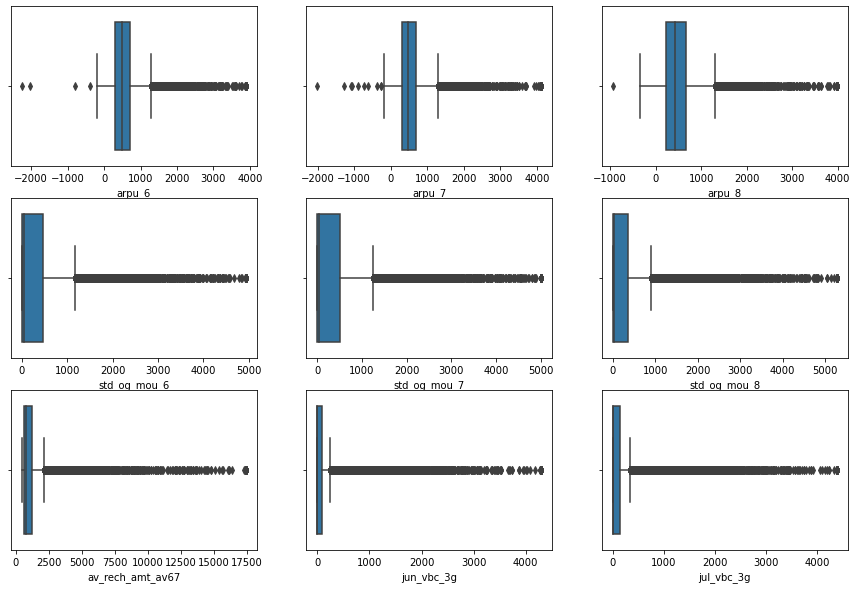

In [59]:
#Plotting after outlier treatment

plt.figure(figsize=(15,10))
plt.subplot(3,3 , 1)
sns.boxplot(teldata_high_value['arpu_6'])
plt.subplot(3,3 , 2)
sns.boxplot(teldata_high_value['arpu_7'])
plt.subplot(3,3 , 3)
sns.boxplot(teldata_high_value['arpu_8'])
plt.subplot(3,3 , 4)
sns.boxplot(teldata_high_value['std_og_mou_6'])
plt.subplot(3,3 , 5)
sns.boxplot(teldata_high_value['std_og_mou_7'])
plt.subplot(3,3 , 6)
sns.boxplot(teldata_high_value['std_og_mou_8'])
plt.subplot(3,3 , 7)
sns.boxplot(teldata_high_value['av_rech_amt_av67'])
plt.subplot(3,3 , 8)
sns.boxplot(teldata_high_value['jun_vbc_3g'])
plt.subplot(3,3 , 9)
sns.boxplot(teldata_high_value['jul_vbc_3g'])
plt.plot()

### Derive New features

**Rename columns to bring to same nomenclature as used for other columns**

In [60]:
teldata_high_value=teldata_high_value.rename(columns = {'jun_vbc_3g':'vbc_3g_6',
                                                       'jul_vbc_3g':'vbc_3g_7',
                                                       'aug_vbc_3g':'vbc_3g_8',
                                                       'sep_vbc_3g':'vbc_3g_9'})

**Lets create columns with average of 6th & 7th month since it's a "Good" Phase and keep the 8th month untouched as it's "Action" Phase** 

In [61]:
avg67_col_list = teldata_high_value.filter(regex='_6|_7').columns.str[:-2]
avg67_col_list.unique()

for idx, col in enumerate(avg67_col_list.unique()):
    print(col)
    avg_col_name = "avg_"+col+"_av67"
    col_6 = col+"_6"
    col_7 = col+"_7"
    teldata_high_value[avg_col_name] = (teldata_high_value[col_6]  + teldata_high_value[col_7])/ 2

arpu
onnet_mou
offnet_mou
roam_ic_mou
roam_og_mou
loc_og_t2f_mou
loc_og_t2c_mou
loc_og_mou
std_og_t2f_mou
std_og_mou
isd_og_mou
spl_og_mou
og_others
loc_ic_t2f_mou
loc_ic_mou
std_ic_t2t_mou
std_ic_t2f_mou
std_ic_mou
spl_ic_mou
isd_ic_mou
ic_others
total_rech_num
max_rech_amt
last_day_rch_amt
vol_2g_mb
arpu_3g
arpu_2g
monthly_2g
sachet_2g
monthly_3g
sachet_3g
vbc_3g
total_rech_data_amnt


In [62]:
#Lets also convert AON (Age on network) days to Months and drop the 'aon' column
teldata_high_value['aon_mon'] = teldata_high_value['aon']/30
teldata_high_value.drop('aon', axis=1, inplace=True)
teldata_high_value['aon_mon'].head()

0     32.266667
7     26.733333
8     10.500000
21    24.000000
23    20.133333
Name: aon_mon, dtype: float64

In [63]:
teldata_high_value.shape

(30001, 137)

In [64]:
col_list = teldata_high_value.filter(regex='_6|_7').columns

teldata_high_value.drop(col_list, axis=1, inplace=True)
teldata_high_value.shape

(30001, 71)

In [65]:
teldata_high_value.head()

,mobile_number,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,arpu_3g_8,arpu_2g_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,vbc_3g_8,vbc_3g_9,total_rech_data_amnt_8,av_rech_amt_av67,churn,avg_arpu_av67,avg_onnet_mou_av67,avg_offnet_mou_av67,avg_roam_ic_mou_av67,avg_roam_og_mou_av67,avg_loc_og_t2f_mou_av67,avg_loc_og_t2c_mou_av67,avg_loc_og_mou_av67,avg_std_og_t2f_mou_av67,avg_std_og_mou_av67,avg_isd_og_mou_av67,avg_spl_og_mou_av67,avg_og_others_av67,avg_loc_ic_t2f_mou_av67,avg_loc_ic_mou_av67,avg_std_ic_t2t_mou_av67,avg_std_ic_t2f_mou_av67,avg_std_ic_mou_av67,avg_spl_ic_mou_av67,avg_isd_ic_mou_av67,avg_ic_others_av67,avg_total_rech_num_av67,avg_max_rech_amt_av67,avg_last_day_rch_amt_av67,avg_vol_2g_mb_av67,avg_arpu_3g_av67,avg_arpu_2g_av67,avg_monthly_2g_av67,avg_sachet_2g_av67,avg_monthly_3g_av67,avg_sachet_3g_av67,avg_vbc_3g_av67,avg_total_rech_data_amnt_av67,aon_mon
0,7.000843e+09,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,1.15,5.44,0.00,0.00,0.00,0.0,0.00,0.00,2.0,252.0,252.0,5.75,212.17,212.17,0.0,0.0,1.0,0.0,30.40,3.58,252.0,559.0,1.0,206.1005,33.32,94.0225,0.00,0.000,0.000,0.0,64.3975,0.00,11.365,0.000,0.00,0.0,0.905,92.355,0.000,0.000,5.925,0.000,0.000,0.000,3.5,252.0,252.0,15.725,212.170,212.17,0.0,0.0,1.0,0.0,50.600,252.0,32.266667
7,7.000702e+09,3171.480,52.29,325.91,31.64,38.06,53.23,0.00,255.79,16.68,77.84,10.01,6.50,0.0,39.53,188.04,30.39,22.21,193.94,0.0,31.59,15.14,7.0,1580.0,779.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,57.74,0.00,0.0,1185.0,1.0,1209.5150,56.26,510.2950,24.86,18.165,58.635,0.0,478.0350,13.37,68.000,0.090,2.25,0.0,126.810,391.555,24.360,43.215,176.810,0.105,8.295,15.465,5.0,1185.0,0.0,0.000,0.000,0.00,0.0,0.0,0.0,0.0,19.060,0.0,26.733333
8,7.001525e+09,137.362,35.08,136.48,0.00,0.00,0.00,7.15,63.04,0.00,98.28,0.00,10.23,0.0,0.00,15.79,0.10,0.00,0.75,0.0,0.00,0.00,14.0,30.0,10.0,0.03,19.83,0.00,0.0,3.0,0.0,0.0,21.03,0.00,207.0,696.0,0.0,435.4720,382.36,87.6450,0.00,0.000,0.000,0.0,333.1350,0.00,136.870,0.000,0.00,0.0,0.000,52.630,0.290,0.000,13.545,0.000,0.000,0.000,20.0,122.0,25.0,178.000,0.000,0.00,0.5,0.5,0.0,0.0,516.405,177.0,10.500000
21,7.002124e+09,637.760,85.14,983.39,0.00,0.00,1.58,0.00,129.74,0.00,938.79,0.00,0.00,0.0,10.39,159.11,0.18,0.00,101.93,0.0,0.00,0.00,27.0,50.0,50.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,640.0,0.0,556.1030,117.26,827.3050,0.00,0.000,0.375,0.0,95.5650,0.00,848.990,0.000,0.00,0.0,3.725,106.505,10.020,0.000,62.985,0.000,0.000,0.000,24.0,50.0,25.0,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.000,0.0,24.000000
23,7.000887e+09,366.966,33.58,205.89,0.00,0.00,0.00,17.71,182.14,0.00,39.61,0.00,17.71,0.0,0.71,224.21,13.38,0.00,57.29,0.0,3.74,13.06,4.0,179.0,0.0,0.01,197.27,150.67,0.0,0.0,1.0,1.0,40.45,0.00,540.0,583.0,0.0,134.1235,49.81,87.3850,0.00,0.000,0.000,0.0,132.7950,0.00,4.355,0.005,0.05,0.0,0.000,145.520,0.255,0.000,8.915,0.000,14.115,2.675,4.0,89.5,89.5,0.240,153.285,150.89,0.0,0.0,1.0,0.0,25.930,356.0,20.133333


#### Now that all pre-processing steps are complete we can move towards visualization techniques to look for any patterns if any

## EDA & Data Visualization

### Univariate Analysis

#### Lets have a look at distriution of our label - "Churn" variable 

Text(0.5, 1.0, 'Churn Distribution')

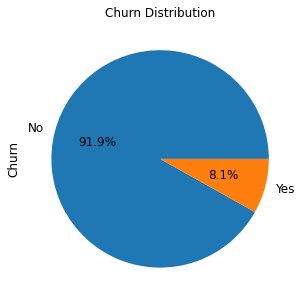

In [66]:
#Churn Distribution
ax = (teldata_high_value['churn'].value_counts()*100.0 /len(teldata_high_value)).plot.pie(autopct='%.1f%%', labels = ['No', 'Yes'],figsize =(5,5), fontsize = 12 )                                                                           
ax.set_ylabel('Churn',fontsize = 12)
ax.set_title('Churn Distribution', fontsize = 12)

In [67]:
#Funtion to create a distplot and violin plot for the column passed as an arguement
def univariate_plot_continuous(goodMonthColumnName, actionMonthColumnName,datasetName):
    plt.figure(figsize=(15,10))
    
    plt.subplot(2,2,1)
    sns.distplot(datasetName[goodMonthColumnName])
    plt.xlabel(goodMonthColumnName)
    plt.ylabel("Frequency distribution")
    plt.title("Frequency distribution of {0}".format(goodMonthColumnName))
    
    plt.subplot(2,2,2)
    sns.violinplot(x = goodMonthColumnName, data=datasetName,inner='quartile', palette='hls')
    plt.xlabel(goodMonthColumnName)
    plt.ylabel("Frequency distribution")
    plt.title("Frequency distribution of {0}".format(goodMonthColumnName))
    
    plt.subplot(2,2,3)
    sns.distplot(datasetName[actionMonthColumnName])
    plt.xlabel(actionMonthColumnName)
    plt.ylabel("Frequency distribution")
    plt.title("Frequency distribution of {0}".format(actionMonthColumnName))
    
    plt.subplot(2,2,4)
    sns.violinplot(x = actionMonthColumnName, data=datasetName,inner='quartile', palette='hls')
    plt.xlabel(actionMonthColumnName)
    plt.ylabel("Frequency distribution")
    plt.title("Frequency distribution of {0}".format(actionMonthColumnName))
    
    plt.plot()

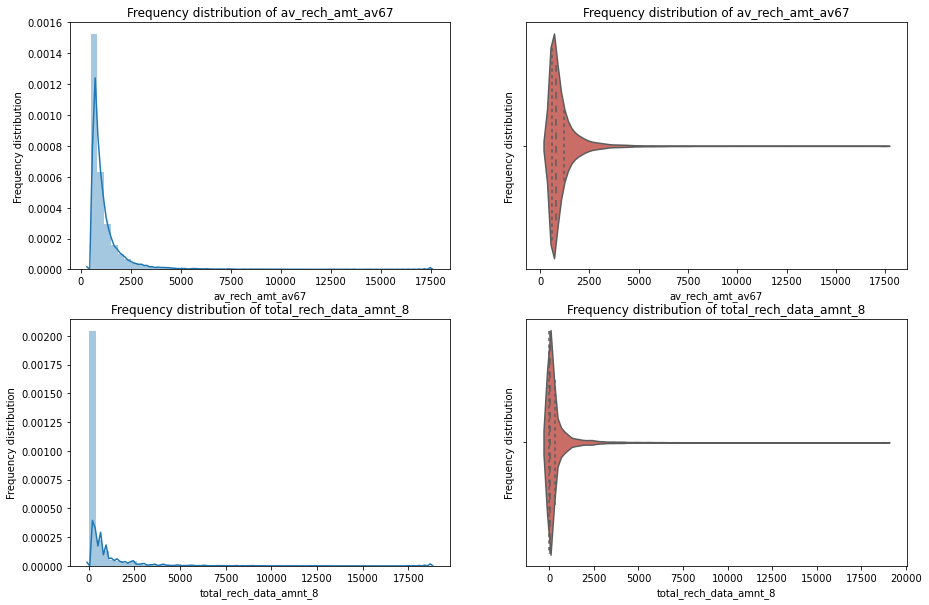

In [68]:
univariate_plot_continuous("av_rech_amt_av67","total_rech_data_amnt_8", teldata_high_value)

**We Observed in above graph that total recharge amount (data+mobile) goes down during the action phase. This could be due to a lot of customers about to churn. Will have a detailed look at it in bivariate analysis.**

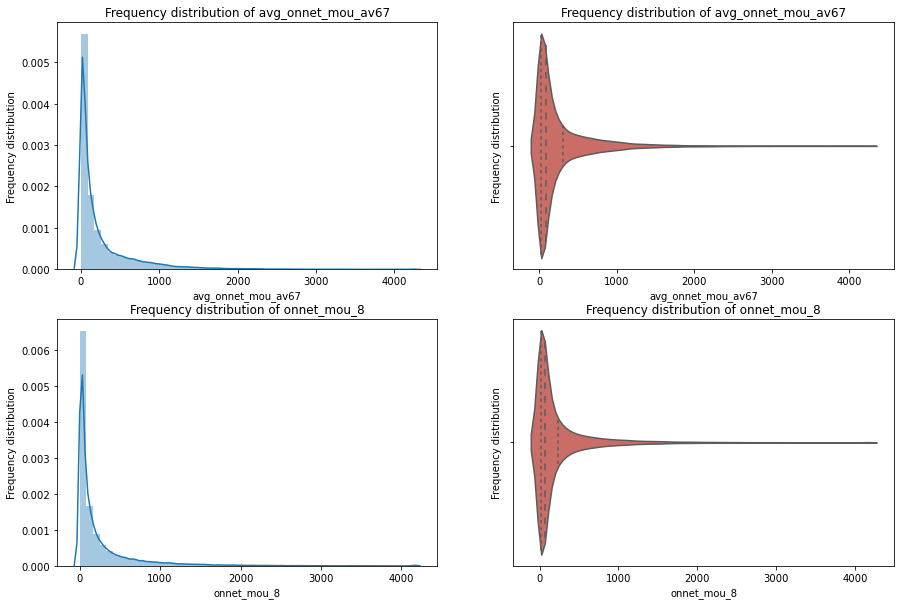

In [69]:
univariate_plot_continuous("avg_onnet_mou_av67","onnet_mou_8", teldata_high_value)

**On network usage doesnt change from good to action phase**

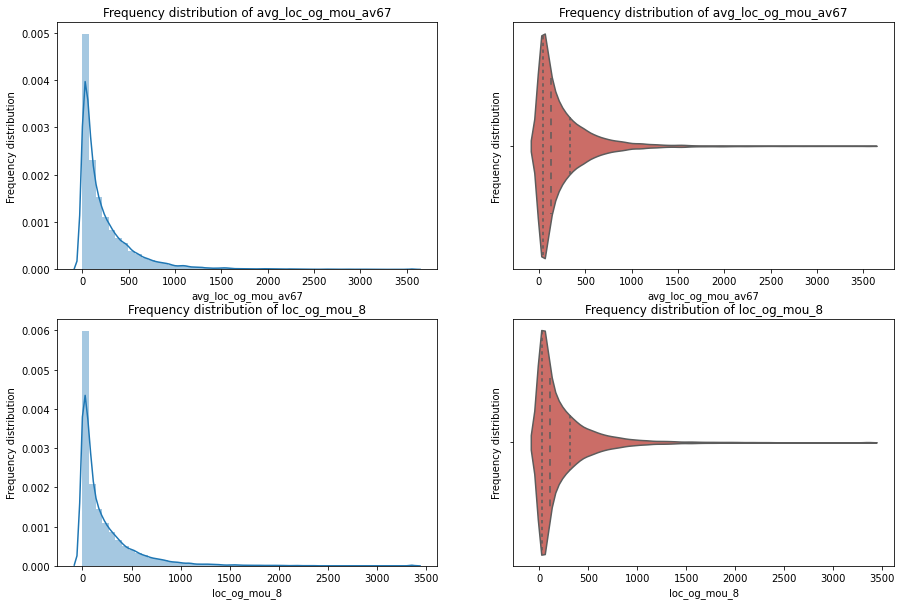

In [70]:
univariate_plot_continuous("avg_loc_og_mou_av67","loc_og_mou_8", teldata_high_value)

**There is not significant change from good to action phase for local outgoing**

Text(0.5, 1.0, 'Frequency distribution of aon_mon')

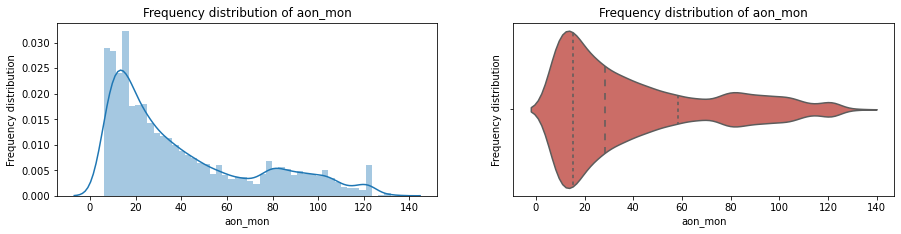

In [71]:
#Let us plot the Age on network months to get a sense of distribution
plt.figure(figsize=(15,7))

plt.subplot(2,2,1)
sns.distplot(teldata_high_value["aon_mon"])
plt.xlabel("aon_mon")
plt.ylabel("Frequency distribution")
plt.title("Frequency distribution of {0}".format("aon_mon"))

plt.subplot(2,2,2)
sns.violinplot(x = "aon_mon", data=teldata_high_value,inner='quartile', palette='hls')
plt.xlabel("aon_mon")
plt.ylabel("Frequency distribution")
plt.title("Frequency distribution of {0}".format("aon_mon"))

**What we learn from this is that the median customer stays with same network between 15-30 months**

**Visualizing the average revenue per user during the ‘Good’ phase and 'Action’ phase**

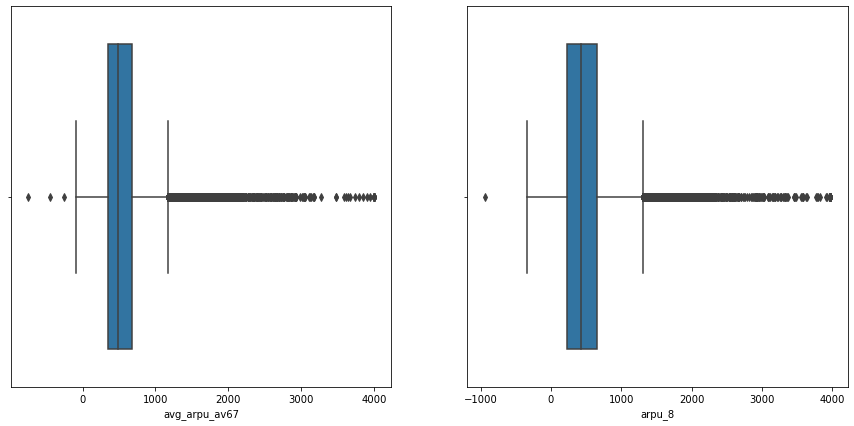

In [72]:
plt.figure(figsize =(15, 7))
plt.subplot(1,2 , 1)
sns.boxplot(teldata_high_value['avg_arpu_av67'])
plt.subplot(1,2 , 2)
sns.boxplot(teldata_high_value['arpu_8'])

#### What we see from above box plots is that for both phases ,arpu metric spread and outlier patterns are almost identical and does not give any meaningful insights

### Bivariate plots

In [73]:
businessImportanceColumns=["arpu_8","avg_arpu_av67","onnet_mou_8","avg_onnet_mou_av67","offnet_mou_8","avg_offnet_mou_av67","total_rech_data_amnt_8","av_rech_amt_av67","churn","aon_mon"]

<Figure size 720x432 with 0 Axes>

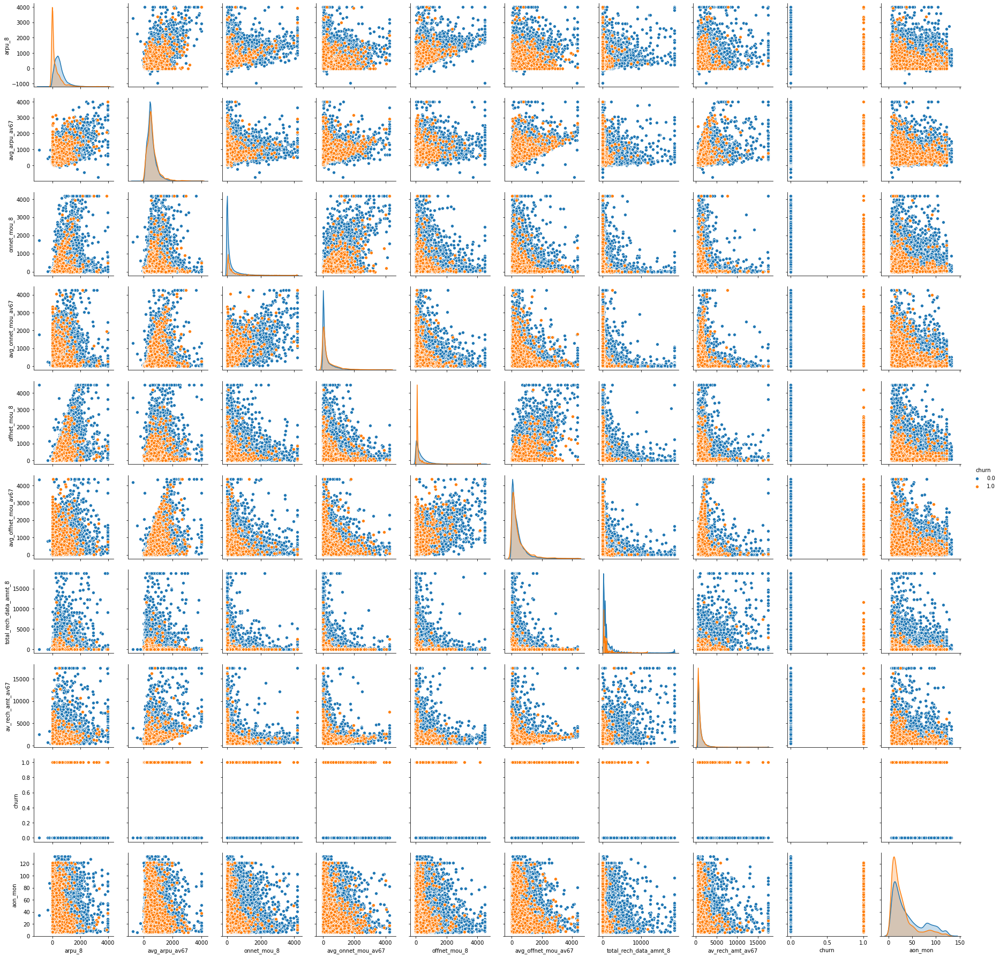

In [74]:
plt.figure(figsize =(10, 6)) 
sns.pairplot(teldata_high_value[businessImportanceColumns], kind='scatter', hue="churn")
plt.show()

**Observations from above pair plots:**
- **Average revenue per user was almost same for churn and non-churn customers for good phase.**
- **Customers with higher revenue per user in action phase churn more**
- **Customers with higher total recharge amount in good phase churn more.**
- **Customers with low on network usage in good phase churn more.**
- **Customers with higher off network usage in action phase churn more.**
- **Total recharge amount of churn customers is increases slightly in action phase.**
- **Customers with higher tenure tend to churn more.**

**Let zoom into the relationship between few metrics vs churn**

In [75]:
def bivariateSegmentedBoxPlots(goodPhaseColumnName,actionPhaseColumnName):
    plt.figure(figsize =(15, 7)) 
    plt.subplot(1,2, 1)
    sns.boxplot( data=teldata_high_value, y=teldata_high_value[goodPhaseColumnName],x="churn",hue="churn" ,palette=("plasma"))
    plt.xlabel("churn")
    plt.ylabel(goodPhaseColumnName)
    plt.title("Box plot of of {0}".format(goodPhaseColumnName))
    
    plt.subplot(1,2,2)
    sns.boxplot( data=teldata_high_value, y=teldata_high_value[actionPhaseColumnName],x="churn",hue="churn",palette=("plasma"))
    plt.xlabel("churn")
    plt.ylabel(actionPhaseColumnName)
    plt.title("Box plot of {0}".format(actionPhaseColumnName))
    
    plt.show()

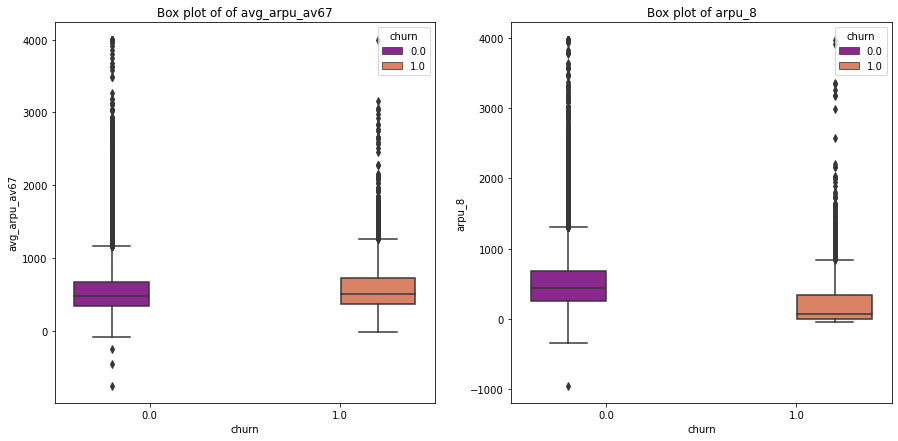

In [76]:
#Average revenue per user vs churn
bivariateSegmentedBoxPlots("avg_arpu_av67","arpu_8")

**Average revenue per user has dropped for the action month i.e. month 8 for churn customers thus signaling some behaviourial shift**

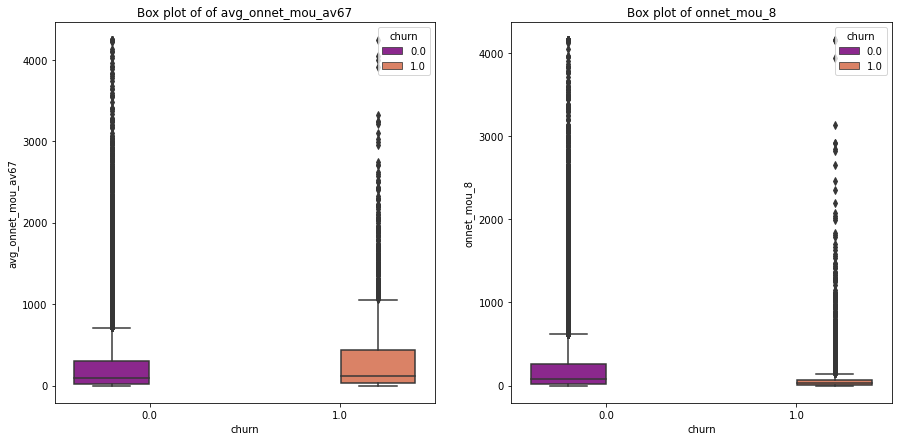

In [77]:
#Average on network usage vs churn
bivariateSegmentedBoxPlots("avg_onnet_mou_av67","onnet_mou_8")

**On network usage has dropped for the action month for churned customers**

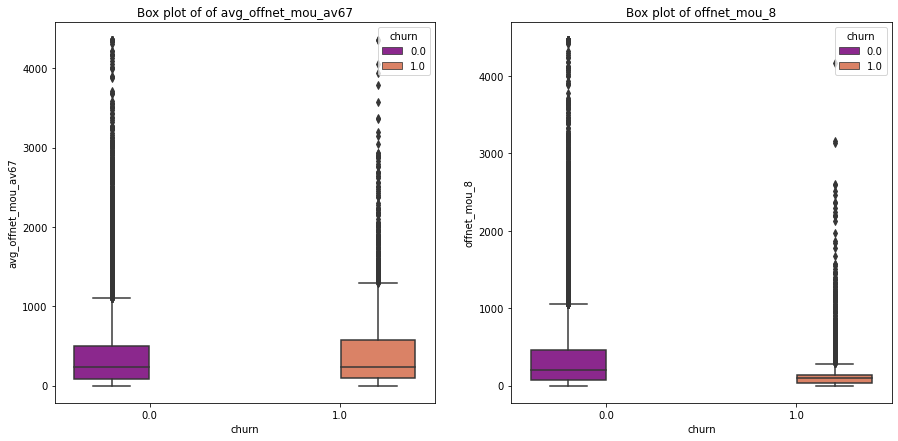

In [78]:
#Average off network usage vs churn
bivariateSegmentedBoxPlots("avg_offnet_mou_av67","offnet_mou_8")

**Off network usage has dropped for the action month for churned customers**

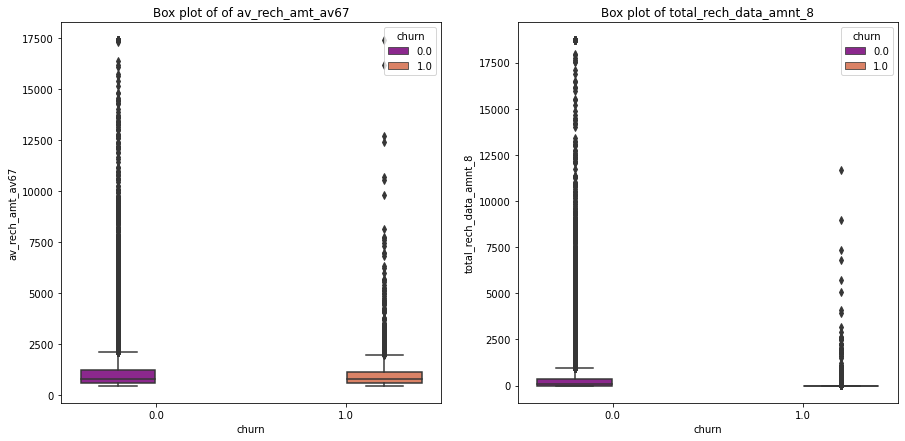

In [79]:
#Average recharge amount vs churn
bivariateSegmentedBoxPlots("av_rech_amt_av67","total_rech_data_amnt_8")

**Average recharge amount has declined sharply for churned customers in action phase.**

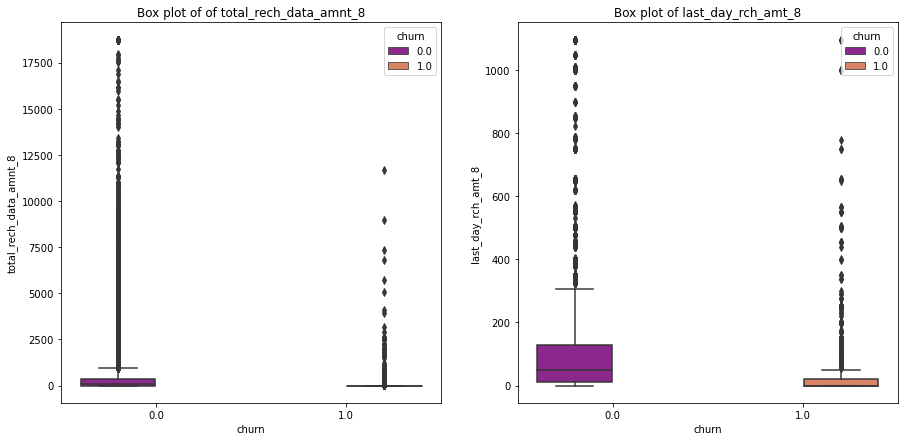

In [80]:
bivariateSegmentedBoxPlots("total_rech_data_amnt_8","last_day_rch_amt_8")

#### Again we see a huge drop in the last day recharge amount for churn customers for month 8 signaling the customer is planning to shift soon

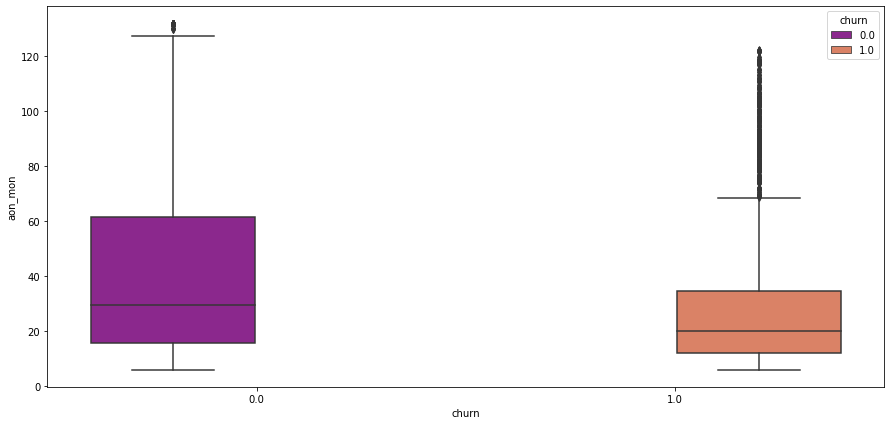

In [81]:
#Age on network months vs churn
plt.figure(figsize =(15, 7)) 
sns.boxplot( data=teldata_high_value, y=teldata_high_value['aon_mon'],x="churn",hue="churn" ,palette=("plasma"))
plt.show()

#### The inference from this is that  if a the customer has been on the network for a longer term the chances of they being retained are much higher 


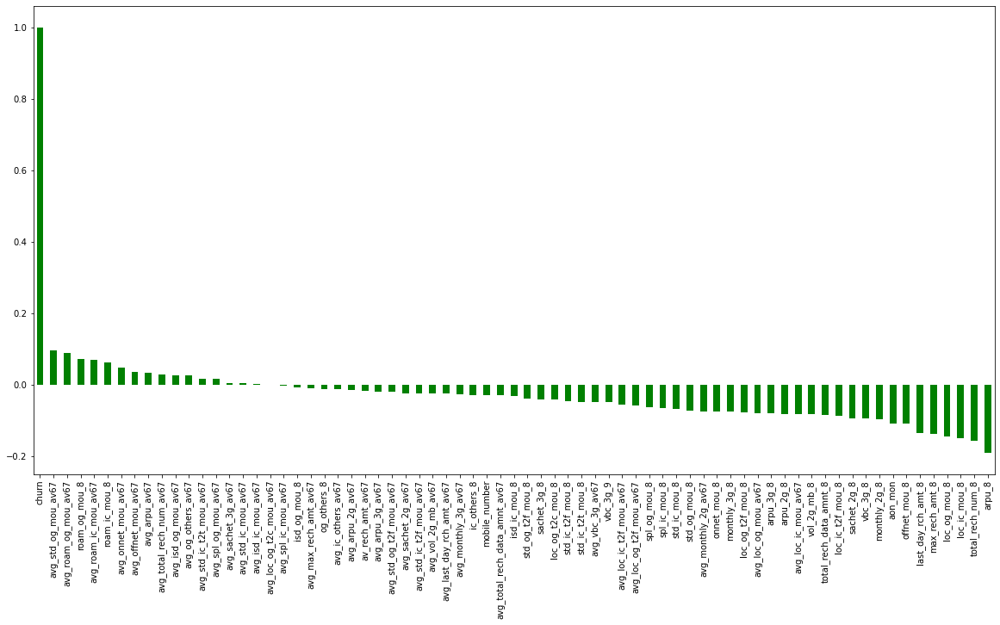

In [82]:
#Get Correlation of "Churn" with other variables:
plt.figure(figsize=(20,10))
teldata_high_value.corr()['churn'].sort_values(ascending = False).plot(kind='bar',color='g')

**The Churn is positively correlated with STD and roaming outgoing for months 6 & 7 , while it is negatively correlated with arpu and number of total recharge for month 8**

## Data Standardization

In [83]:
# Putting feature variable to X
X = teldata_high_value.drop(['churn','mobile_number'], axis=1)
X.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,arpu_3g_8,arpu_2g_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,vbc_3g_8,vbc_3g_9,total_rech_data_amnt_8,av_rech_amt_av67,avg_arpu_av67,avg_onnet_mou_av67,avg_offnet_mou_av67,avg_roam_ic_mou_av67,avg_roam_og_mou_av67,avg_loc_og_t2f_mou_av67,avg_loc_og_t2c_mou_av67,avg_loc_og_mou_av67,avg_std_og_t2f_mou_av67,avg_std_og_mou_av67,avg_isd_og_mou_av67,avg_spl_og_mou_av67,avg_og_others_av67,avg_loc_ic_t2f_mou_av67,avg_loc_ic_mou_av67,avg_std_ic_t2t_mou_av67,avg_std_ic_t2f_mou_av67,avg_std_ic_mou_av67,avg_spl_ic_mou_av67,avg_isd_ic_mou_av67,avg_ic_others_av67,avg_total_rech_num_av67,avg_max_rech_amt_av67,avg_last_day_rch_amt_av67,avg_vol_2g_mb_av67,avg_arpu_3g_av67,avg_arpu_2g_av67,avg_monthly_2g_av67,avg_sachet_2g_av67,avg_monthly_3g_av67,avg_sachet_3g_av67,avg_vbc_3g_av67,avg_total_rech_data_amnt_av67,aon_mon
0,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,1.15,5.44,0.00,0.00,0.00,0.0,0.00,0.00,2.0,252.0,252.0,5.75,212.17,212.17,0.0,0.0,1.0,0.0,30.40,3.58,252.0,559.0,206.1005,33.32,94.0225,0.00,0.000,0.000,0.0,64.3975,0.00,11.365,0.000,0.00,0.0,0.905,92.355,0.000,0.000,5.925,0.000,0.000,0.000,3.5,252.0,252.0,15.725,212.170,212.17,0.0,0.0,1.0,0.0,50.600,252.0,32.266667
7,3171.480,52.29,325.91,31.64,38.06,53.23,0.00,255.79,16.68,77.84,10.01,6.50,0.0,39.53,188.04,30.39,22.21,193.94,0.0,31.59,15.14,7.0,1580.0,779.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,57.74,0.00,0.0,1185.0,1209.5150,56.26,510.2950,24.86,18.165,58.635,0.0,478.0350,13.37,68.000,0.090,2.25,0.0,126.810,391.555,24.360,43.215,176.810,0.105,8.295,15.465,5.0,1185.0,0.0,0.000,0.000,0.00,0.0,0.0,0.0,0.0,19.060,0.0,26.733333
8,137.362,35.08,136.48,0.00,0.00,0.00,7.15,63.04,0.00,98.28,0.00,10.23,0.0,0.00,15.79,0.10,0.00,0.75,0.0,0.00,0.00,14.0,30.0,10.0,0.03,19.83,0.00,0.0,3.0,0.0,0.0,21.03,0.00,207.0,696.0,435.4720,382.36,87.6450,0.00,0.000,0.000,0.0,333.1350,0.00,136.870,0.000,0.00,0.0,0.000,52.630,0.290,0.000,13.545,0.000,0.000,0.000,20.0,122.0,25.0,178.000,0.000,0.00,0.5,0.5,0.0,0.0,516.405,177.0,10.500000
21,637.760,85.14,983.39,0.00,0.00,1.58,0.00,129.74,0.00,938.79,0.00,0.00,0.0,10.39,159.11,0.18,0.00,101.93,0.0,0.00,0.00,27.0,50.0,50.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,640.0,556.1030,117.26,827.3050,0.00,0.000,0.375,0.0,95.5650,0.00,848.990,0.000,0.00,0.0,3.725,106.505,10.020,0.000,62.985,0.000,0.000,0.000,24.0,50.0,25.0,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.000,0.0,24.000000
23,366.966,33.58,205.89,0.00,0.00,0.00,17.71,182.14,0.00,39.61,0.00,17.71,0.0,0.71,224.21,13.38,0.00,57.29,0.0,3.74,13.06,4.0,179.0,0.0,0.01,197.27,150.67,0.0,0.0,1.0,1.0,40.45,0.00,540.0,583.0,134.1235,49.81,87.3850,0.00,0.000,0.000,0.0,132.7950,0.00,4.355,0.005,0.05,0.0,0.000,145.520,0.255,0.000,8.915,0.000,14.115,2.675,4.0,89.5,89.5,0.240,153.285,150.89,0.0,0.0,1.0,0.0,25.930,356.0,20.133333


In [84]:
# Putting response variable to y
y = teldata_high_value['churn']
y.head()

0     1.0
7     1.0
8     0.0
21    0.0
23    0.0
Name: churn, dtype: float64

In [85]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(0)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

print(X_train.shape)
print(X_test.shape)

(21000, 69)
(9001, 69)


In [86]:
print(y_train.shape)
print(y_test.shape)

(21000,)
(9001,)


In [87]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

cols = X_train.columns.values
cols

array(['arpu_8', 'onnet_mou_8', 'offnet_mou_8', 'roam_ic_mou_8',
       'roam_og_mou_8', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_8',
       'loc_og_mou_8', 'std_og_t2f_mou_8', 'std_og_mou_8', 'isd_og_mou_8',
       'spl_og_mou_8', 'og_others_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_8',
       'std_ic_t2t_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8',
       'spl_ic_mou_8', 'isd_ic_mou_8', 'ic_others_8', 'total_rech_num_8',
       'max_rech_amt_8', 'last_day_rch_amt_8', 'vol_2g_mb_8', 'arpu_3g_8',
       'arpu_2g_8', 'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8',
       'sachet_3g_8', 'vbc_3g_8', 'vbc_3g_9', 'total_rech_data_amnt_8',
       'av_rech_amt_av67', 'avg_arpu_av67', 'avg_onnet_mou_av67',
       'avg_offnet_mou_av67', 'avg_roam_ic_mou_av67',
       'avg_roam_og_mou_av67', 'avg_loc_og_t2f_mou_av67',
       'avg_loc_og_t2c_mou_av67', 'avg_loc_og_mou_av67',
       'avg_std_og_t2f_mou_av67', 'avg_std_og_mou_av67',
       'avg_isd_og_mou_av67', 'avg_spl_og_mou_av67', 'avg_og_others_av67',
    

In [88]:
X_train[cols] = scaler.fit_transform(X_train)
X_train.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,arpu_3g_8,arpu_2g_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,vbc_3g_8,vbc_3g_9,total_rech_data_amnt_8,av_rech_amt_av67,avg_arpu_av67,avg_onnet_mou_av67,avg_offnet_mou_av67,avg_roam_ic_mou_av67,avg_roam_og_mou_av67,avg_loc_og_t2f_mou_av67,avg_loc_og_t2c_mou_av67,avg_loc_og_mou_av67,avg_std_og_t2f_mou_av67,avg_std_og_mou_av67,avg_isd_og_mou_av67,avg_spl_og_mou_av67,avg_og_others_av67,avg_loc_ic_t2f_mou_av67,avg_loc_ic_mou_av67,avg_std_ic_t2t_mou_av67,avg_std_ic_t2f_mou_av67,avg_std_ic_mou_av67,avg_spl_ic_mou_av67,avg_isd_ic_mou_av67,avg_ic_others_av67,avg_total_rech_num_av67,avg_max_rech_amt_av67,avg_last_day_rch_amt_av67,avg_vol_2g_mb_av67,avg_arpu_3g_av67,avg_arpu_2g_av67,avg_monthly_2g_av67,avg_sachet_2g_av67,avg_monthly_3g_av67,avg_sachet_3g_av67,avg_vbc_3g_av67,avg_total_rech_data_amnt_av67,aon_mon
39186,0.205554,-0.520604,-0.523012,0.318013,-0.103540,-0.334750,-0.088717,-0.611367,-0.165245,-0.497040,3.149235,-0.304948,-0.051311,-0.311127,-0.243232,-0.251607,-0.198772,0.116446,-0.251868,0.814828,-0.157320,-0.768939,0.427597,0.845974,-0.357870,-0.382490,-0.396975,-0.379406,-0.423777,-0.352433,-0.204059,-0.418072,-0.171096,-0.354552,0.032790,1.232503,-0.601735,-0.496375,0.237782,-0.145711,-0.323500,0.319063,-0.639490,-0.181881,-0.607636,7.393751,-0.149343,-0.334629,-0.174455,-0.216773,-0.286725,-0.217596,-0.189431,-0.434381,3.563107,-0.017184,-0.622857,1.725316,1.052229,-0.435166,-0.432078,-0.457675,-0.464299,-0.478611,-0.404579,-0.251648,-0.440281,-0.446756,2.583931
39833,-0.337234,-0.439067,-0.156426,-0.197245,-0.215129,1.669857,-0.284546,0.143813,-0.165245,-0.486802,-0.089505,-0.368097,-0.051311,-0.009876,0.218044,-0.251607,-0.198772,-0.176677,-0.251868,-0.078643,-0.130502,-0.547671,-0.183818,0.299441,0.801454,-0.382490,-0.396907,-0.379406,-0.021493,-0.352433,-0.204059,0.040141,-0.171096,-0.277246,-0.201966,-0.404944,-0.389461,-0.230686,-0.244437,-0.262349,0.137440,1.368380,0.081404,0.166077,-0.481207,-0.110580,0.140119,-0.334629,1.477723,0.126281,0.014302,1.463572,0.144826,-0.434381,0.399552,0.467562,-0.504941,-0.373816,0.030759,-0.167254,-0.344860,-0.453703,-0.464299,0.569202,-0.404579,-0.251648,0.118781,-0.060805,1.210336
38778,-0.457715,-0.342300,-0.270487,0.935793,0.652797,-0.334750,-0.284546,-0.239149,-0.165245,-0.407430,-0.089505,-0.368097,-0.051311,-0.244356,-0.091468,0.370574,-0.198772,0.216563,-0.251868,0.060021,1.761662,0.005500,-0.183818,-0.481320,-0.357870,-0.382490,-0.396975,-0.379406,-0.423777,-0.352433,-0.204059,-0.418072,-0.171096,-0.354552,-0.483838,-0.701870,-0.446193,-0.138102,0.275843,-0.010306,-0.068597,-0.345194,-0.058130,-0.181881,-0.389859,-0.105024,-0.460259,-0.334629,-0.385677,-0.338318,-0.112954,-0.217596,-0.075950,-0.434381,-0.067957,-0.168714,-0.387025,-0.313554,-0.641141,-0.434764,-0.432078,-0.457242,-0.464299,0.569202,-0.404579,-0.251648,-0.440281,-0.266245,2.202611
43026,0.473547,1.053765,0.478019,0.180545,0.051507,0.765636,0.139158,2.229956,2.898295,-0.174661,-0.089505,0.476389,-0.051311,0.922829,4.180285,-0.251607,0.241671,-0.199857,-0.251868,-0.180342,-0.157320,0.005500,-0.183818,0.299441,-0.357870,-0.382490,-0.396975,-0.379406,-0.423777,-0.352433,-0.204059,-0.418072,-0.171096,-0.354552,-0.282560,0.620653,2.375293,-0.094284,0.100278,-0.071781,0.315187,-0.345194,0.002217,-0.181881,1.696761,-0.110580,0.701224,-0.334629,0.755122,0.135136,-0.284084,-0.127945,6.289439,0.397054,-0.199187,-0.168714,-0.033278,-0.340337,-0.414148,-0.435166,-0.432078,-0.457675,-0.464299,-0.478611,-0.404579,-0.251648,-0.440281,-0.446756,0.280210
12271,-0.574593,-0.477301,-0.558937,-0.197245,-0.215129,-0.126976,-0.284546,-0.412555,-0.165245,-0.499383,-0.089505

In [89]:
X_test[cols] = scaler.transform(X_test)
X_test.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,max_rech_amt_8,last_day_rch_amt_8,vol_2g_mb_8,arpu_3g_8,arpu_2g_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,vbc_3g_8,vbc_3g_9,total_rech_data_amnt_8,av_rech_amt_av67,avg_arpu_av67,avg_onnet_mou_av67,avg_offnet_mou_av67,avg_roam_ic_mou_av67,avg_roam_og_mou_av67,avg_loc_og_t2f_mou_av67,avg_loc_og_t2c_mou_av67,avg_loc_og_mou_av67,avg_std_og_t2f_mou_av67,avg_std_og_mou_av67,avg_isd_og_mou_av67,avg_spl_og_mou_av67,avg_og_others_av67,avg_loc_ic_t2f_mou_av67,avg_loc_ic_mou_av67,avg_std_ic_t2t_mou_av67,avg_std_ic_t2f_mou_av67,avg_std_ic_mou_av67,avg_spl_ic_mou_av67,avg_isd_ic_mou_av67,avg_ic_others_av67,avg_total_rech_num_av67,avg_max_rech_amt_av67,avg_last_day_rch_amt_av67,avg_vol_2g_mb_av67,avg_arpu_3g_av67,avg_arpu_2g_av67,avg_monthly_2g_av67,avg_sachet_2g_av67,avg_monthly_3g_av67,avg_sachet_3g_av67,avg_vbc_3g_av67,avg_total_rech_data_amnt_av67,aon_mon
20296,-0.534616,-0.513444,-0.688836,-0.197245,-0.215129,-0.236667,-0.284546,-0.614161,-0.068074,-0.508245,-0.089505,-0.190704,-0.051311,0.230865,-0.599630,-0.251607,-0.198772,-0.331547,-0.251868,-0.180342,-0.157320,-0.658305,-0.097356,0.408748,-0.357870,-0.382490,-0.396975,-0.379406,-0.423777,-0.352433,-0.204059,-0.418072,-0.171096,-0.354552,-0.345795,-0.052973,-0.592986,-0.766453,-0.244437,-0.262349,-0.212052,-0.342080,-0.646639,-0.131586,-0.593802,-0.11058,-0.290437,-0.334629,-0.082397,-0.589187,0.002115,0.015496,-0.218836,-0.434381,-0.199187,-0.168714,-0.033278,-0.239900,-0.096357,-0.435166,-0.432078,-0.457675,-0.464299,-0.478611,-0.404579,-0.251648,-0.440281,-0.446756,-0.559327
8279,-1.014937,-0.510103,-0.730018,-0.141264,-0.157863,-0.334750,0.201467,-0.673816,-0.165245,-0.515733,-0.089505,-0.211371,-0.051311,-0.367986,-0.728316,0.057469,-0.198772,-0.227940,-0.251868,-0.180342,-0.157320,-0.326402,-0.801410,-0.715549,0.239406,-0.248885,-0.199901,-0.379406,0.380790,-0.352433,0.851160,-0.418072,-0.171096,-0.177064,-0.231724,-1.155874,-0.588535,-0.790077,-0.194498,-0.181766,-0.357506,2.669907,-0.714235,-0.181881,-0.608846,-0.11058,0.732497,-0.334629,-0.385802,-0.655599,-0.250061,-0.217596,-0.392564,-0.434381,-0.199187,-0.168714,-0.092235,-0.959698,-0.772797,0.378757,-0.432078,-0.290538,-0.464299,1.826576,-0.404579,-0.251648,-0.440281,0.203728,-0.491911
72269,0.283624,-0.002285,1.169001,-0.197245,-0.215129,-0.184433,1.502844,1.651984,0.839562,-0.038260,-0.089505,0.262828,-0.051311,0.002122,0.614743,-0.063015,0.697720,0.033777,-0.251868,-0.176195,-0.143911,-0.215768,0.057042,0.299441,-0.357870,-0.382490,-0.396975,-0.379406,-0.423777,-0.352433,-0.204059,-0.418072,-0.171096,-0.354552,0.038576,0.452795,0.057306,0.975285,-0.244437,-0.262349,-0.256059,-0.345194,2.027913,0.146061,-0.390587,-0.11058,0.076118,0.728796,-0.174830,0.675104,-0.109704,0.120943,-0.129227,-0.434381,-0.199187,-0.097095,-0.210151,-0.116028,0.434807,-0.431654,1.162296,0.540635,-0.464299,-0.478611,0.504977,1.550946,-0.307551,-0.153138,-1.020703
65602,-0.111873,-0.268742,-0.250115,-0.197245,-0.215129,-0.334750,-0.284546,0.108815,-0.165245,-0.411556,-0.089505,-0.368097,-0.051311,-0.315039,-0.146967,-0.223789,-0.150219,-0.314182,-0.251868,-0.180342,-0.157320,1.443744,-0.677892,-0.481320,-0.357870,-0.382490,-0.396975,-0.379406,-0.423777,-0.352433,-0.204059,-0.418072,-0.171096,-0.354552,-0.501610,-0.236610,-0.448518,-0.149830,-0.244437,-0.262349,-0.183189,-0.217532,0.012217,-0.181881,-0.410632,-0.11058,-0.226435,-0.334629,-0.180950,0.154092,-0.063291,0.085509,0.192963,-0.434381,0.133848,-0.168714,0.969007,-0.809042,-0.731938,-0.435166,-0.432078,-0.457675,-0.464299,-0.478611,-0.404579,-0.251648,-0.433850,-0.446756,0.014760
42758,-0.976418,-0.423837,-0.726294,0.371510,0.235640,-0.334750,-0.284546,-0.675026,-0.165245,-

## Modeling 

### High Performance Model (With PCA)

In [90]:
pca = PCA(random_state=42)
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='auto', tol=0.0, whiten=False)

In [91]:
pca.explained_variance_ratio_

array([1.08179636e-01, 8.93063653e-02, 6.89062776e-02, 5.00976101e-02,
       4.48425816e-02, 3.79309005e-02, 3.53185015e-02, 3.27101241e-02,
       3.10879096e-02, 3.01996509e-02, 2.56701908e-02, 2.34101786e-02,
       2.26422969e-02, 2.14966142e-02, 2.02324823e-02, 1.91750802e-02,
       1.76425210e-02, 1.74857149e-02, 1.66055146e-02, 1.60694960e-02,
       1.51551954e-02, 1.50443104e-02, 1.38488163e-02, 1.28666383e-02,
       1.22501385e-02, 1.18801642e-02, 1.14193497e-02, 1.07679277e-02,
       1.05911261e-02, 1.03735882e-02, 9.85625491e-03, 9.59226541e-03,
       9.00357614e-03, 8.29950097e-03, 7.74338691e-03, 7.08881474e-03,
       6.59486344e-03, 6.47695769e-03, 6.29172653e-03, 5.89018014e-03,
       5.14452412e-03, 4.54721057e-03, 4.43788188e-03, 4.11751731e-03,
       3.88138129e-03, 3.72640342e-03, 3.50227014e-03, 3.28562917e-03,
       3.22023100e-03, 3.17484309e-03, 3.09498151e-03, 3.05007692e-03,
       2.96735457e-03, 2.84509016e-03, 2.48281913e-03, 2.43277575e-03,
      

Lets see the cumulative sum of explained variance ratio

In [92]:
cum_sum_pca = np.cumsum(pca.explained_variance_ratio_)

**Scree plot**

Scree plot to see with how many principal components the cumulative sum of explained variance ratio reaches 95%

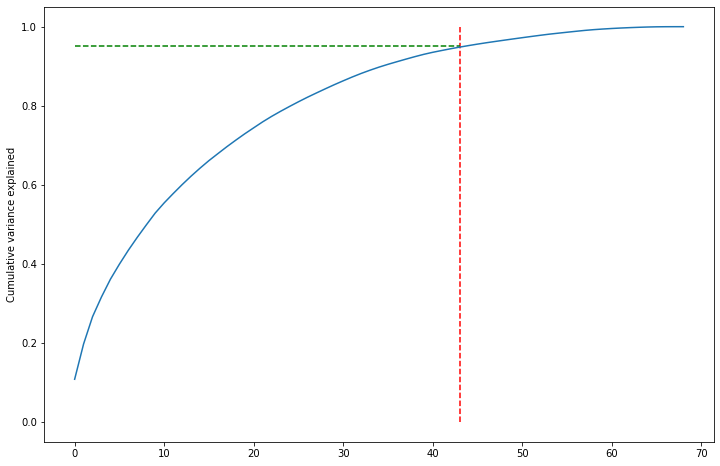

In [93]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=43, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=43, xmin=0, colors="g", linestyles="--")
plt.plot(cum_sum_pca)
plt.ylabel("Cumulative variance explained")
plt.show()

**As seen from the above graph, 95% variance can be explained using 43 principal components**

In [94]:
pca_final = PCA(n_components=43, random_state=42)
df_train_pca = pca_final.fit_transform(X_train)
df_train_pca.shape

(21000, 43)

In [95]:
df_train_pca

array([[ 0.52427219,  1.23503509, -2.01263996, ..., -0.13951508,
         0.2271296 , -0.02666209],
       [-0.41473405, -0.03485935, -1.72767801, ..., -0.3377353 ,
         1.02580561,  0.28025835],
       [-1.4619627 , -0.40480125, -1.04978627, ...,  0.25217489,
        -0.02822765,  0.27216992],
       ...,
       [-1.85284146, -2.27237973, -1.85618063, ..., -0.30928712,
        -0.16360577,  0.12099512],
       [-1.89140121,  0.96951242,  1.26186108, ..., -0.10126474,
         0.37352891,  0.10515376],
       [-0.68746579,  4.47351019,  2.08933725, ..., -0.20373334,
         0.09810677,  0.07424284]])

Applying transformation on the test set

In [96]:
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(9001, 43)

In [97]:
corrmat = np.corrcoef(df_train_pca.transpose())
corrmat.shape

(43, 43)

In [98]:
pca_again = PCA(0.95)
df_train_pca2 = pca_again.fit_transform(X_train)
df_train_pca2.shape

(21000, 45)

Lets have a look at the heatmap of correlation matrix

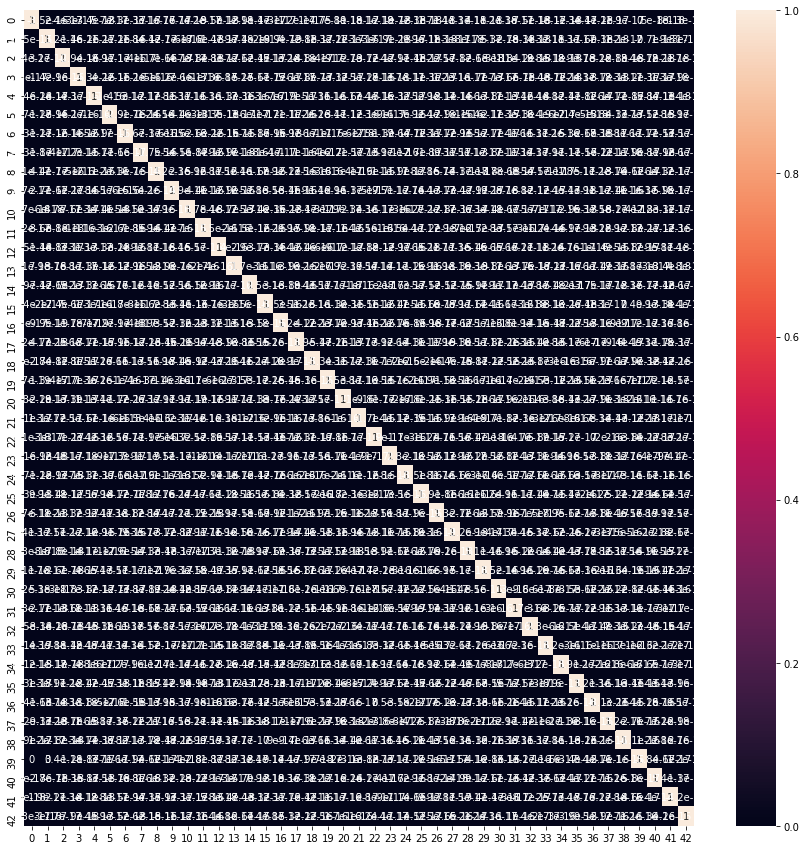

In [99]:
plt.figure(figsize=[15,15])
sns.heatmap(corrmat, annot=True)

### Model 1 - Logistic Regression with PCA

Before we start with modelling, lets create a few functions which can be used for all the models:
    - Fit Model and Evaluate training metrics - Fits the model on training dataset and provide metrics to see training performance.
    - Get Test Model metrics - Provide with all the evaluation metrics for classification models on test dataset.
    - Predict Churn Probability - Provides probabilities as dataframe along with metrics for a particular threshold value.
    - Find optimal cut off - Find the optimal threshold/cut-off value which balances sensitivity, accuracy and specificity.

In [100]:
def fitModel_TrainModelEvaluationMetrics(alg, X_train, y_train, performCV=True, cv_folds=5):
    #Fit the algorithm on the data
    alg.fit(X_train, y_train)
        
    #Predict training set:
    dtrain_predictions = alg.predict(X_train)
    dtrain_predprob = alg.predict_proba(X_train)[:,1]
    
    #Perform cross-validation:
    if performCV:
        cv_score = cross_val_score(alg, X_train, y_train, cv=cv_folds, scoring='roc_auc')
    
    #Print model report:
    print ("\nModel Report")
    print ("Accuracy : %.4g" % metrics.roc_auc_score(y_train, dtrain_predictions))
    print ("Recall/Sensitivity : %.4g" % metrics.recall_score(y_train, dtrain_predictions))
    print ("AUC Score (Train): %f" % metrics.roc_auc_score(y_train, dtrain_predprob))
    
    if performCV:
        print ("CV Score : Mean - %.7g | Std - %.7g | Min - %.7g | Max - %.7g" % (np.mean(cv_score),np.std(cv_score),np.min(cv_score),np.max(cv_score)))

In [101]:
def getTestModelEvaluationMetrics(actual_churn=False,pred_churn=False):

    confusion = metrics.confusion_matrix(actual_churn, pred_churn)

    TP = confusion[1,1] # true positive 
    TN = confusion[0,0] # true negatives
    FP = confusion[0,1] # false positives
    FN = confusion[1,0] # false negatives

    print("Roc_auc_score : {}".format(metrics.roc_auc_score(actual_churn,pred_churn)))
    # Let's see the sensitivity of our logistic regression model
    print('Sensitivity/Recall : {}'.format(TP / float(TP+FN)))
    # Let us calculate specificity
    print('Specificity: {}'.format(TN / float(TN+FP)))
    # Calculate false postive rate - predicting churn when customer does not have churned
    print('False Positive Rate: {}'.format(FP/ float(TN+FP)))
    # positive predictive value 
    print('Positive predictive value: {}'.format(TP / float(TP+FP)))
    # Negative predictive value
    print('Negative Predictive value: {}'.format(TN / float(TN+ FN)))
    # sklearn precision score value 
    print('sklearn precision score value: {}'.format(metrics.precision_score(actual_churn, pred_churn )))

In [102]:
def predictChurnWithProb(model,X,y,prob):
    # Funtion to predict the churn using the input probability cut-off
    # Input arguments: model instance, x and y to predict using model and cut-off probability
    
    # predict
    pred_probs = model.predict_proba(X)[:,1]
    
    y_df= pd.DataFrame({'churn':y, 'churn_Prob':pred_probs})
    # Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
    y_df['final_predicted'] = y_df.churn_Prob.map( lambda x: 1 if x > prob else 0)
    # Let's see the head
    getTestModelEvaluationMetrics(y_df.churn,y_df.final_predicted)
    return y_df

In [103]:
def getOptimalModelThreshold(df):
    #Function to find the optimal threshold for classifing as churn/non-churn
    # Let's create columns with different probability cutoffs 
    numbers = [float(x)/10 for x in range(10)]
    for i in numbers:
        df[i] = df.churn_Prob.map( lambda x: 1 if x > i else 0)
    #print(df.head())
    
    # Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
    cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
    from sklearn.metrics import confusion_matrix
    
    num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
    for i in num:
        cm1 = metrics.confusion_matrix(df.churn, df[i] )
        total1=sum(sum(cm1))
        accuracy = (cm1[0,0]+cm1[1,1])/total1
        
        speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
        sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
        cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
    print(cutoff_df)
    
    # Let's plot accuracy sensitivity and specificity for various probabilities.
    cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
    plt.show()

In [104]:
log_reg_pca = LogisticRegression(class_weight="balanced", random_state=42)
fitModel_TrainModelEvaluationMetrics(log_reg_pca, df_train_pca, y_train)


Model Report
Accuracy : 0.8184
Recall/Sensitivity : 0.8415
AUC Score (Train): 0.887073
CV Score : Mean - 0.882077 | Std - 0.007617701 | Min - 0.8671489 | Max - 0.8872721


In [105]:
y_test_pred_default = log_reg_pca.predict(df_test_pca)
getTestModelEvaluationMetrics(y_test,y_test_pred_default)

Roc_auc_score : 0.8261935926958348
Sensitivity/Recall : 0.8466666666666667
Specificity: 0.805720518725003
False Positive Rate: 0.19427948127499697
Positive predictive value: 0.2837354781054513
Negative Predictive value: 0.982995711962147
sklearn precision score value: 0.2837354781054513


In [106]:
#Lets have a look at the ROC AUC score for train set with predicted probabilities on train dataset
pred_probs_train = log_reg_pca.predict_proba(df_train_pca)[:,1]
print("roc_auc_score(Train) {:2.2}".format(metrics.roc_auc_score(y_train, pred_probs_train)))

roc_auc_score(Train) 0.89


In [107]:
# Lets observe the evaluation metrics with default cut-off value
cut_off_prob=0.5
y_train_df = predictChurnWithProb(log_reg_pca,df_train_pca,y_train,cut_off_prob)
y_train_df.head()

Roc_auc_score : 0.8183953555116378
Sensitivity/Recall : 0.8415138971023063
Specificity: 0.7952768139209695
False Positive Rate: 0.2047231860790305
Positive predictive value: 0.26469494047619047
Negative Predictive value: 0.9828469022017409
sklearn precision score value: 0.26469494047619047


,churn,churn_Prob,final_predicted
39186,0.0,0.648718,1
39833,0.0,0.185340,0
38778,0.0,0.346353,0
43026,0.0,0.051738,0
12271,0.0,0.213474,0


In [108]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

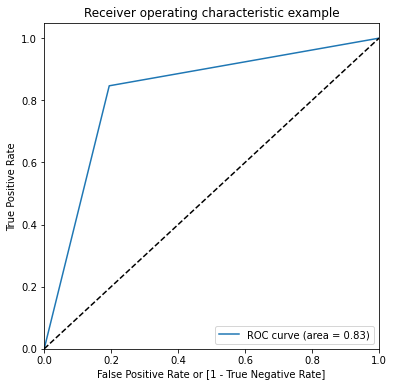

(array([0.        , 0.19427948, 1.        ]),
 array([0.        , 0.84666667, 1.        ]),
 array([2., 1., 0.]))

In [109]:
draw_roc(y_test, y_test_pred_default)

Recall and specificity are important metrics in this business problem as need to predict churn. Lets plot the graph for optimal cut-off point where specificity and recall are balanced.

     prob  accuracy     sensi     speci
0.0   0.0  0.080524  1.000000  0.000000
0.1   0.1  0.393238  0.975754  0.342224
0.2   0.2  0.540714  0.950917  0.504791
0.3   0.3  0.645714  0.915435  0.622093
0.4   0.4  0.729905  0.884092  0.716402
0.5   0.5  0.799000  0.841514  0.795277
0.6   0.6  0.855762  0.777646  0.862603
0.7   0.7  0.894095  0.683028  0.912580
0.8   0.8  0.916905  0.509166  0.952613
0.9   0.9  0.921810  0.205204  0.984567


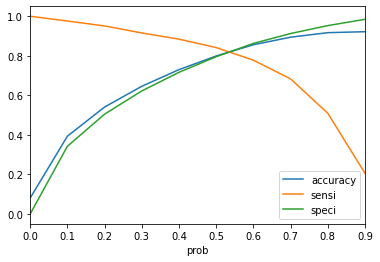

In [110]:
# finding cut-off with the right balance of the metrices
# sensitivity vs specificity trade-off
getOptimalModelThreshold(y_train_df)

From the curve above, 0.5 seems to be a optimal cut-off point. However, since we need to predict churners better which means we need to have better recall value, **lets take optimal cutoff as .45**

In [111]:
# predicting with the choosen cut-off on train
cut_off_prob = 0.45
predictChurnWithProb(log_reg_pca,df_train_pca,y_train,cut_off_prob)

Roc_auc_score : 0.8100591583503359
Sensitivity/Recall : 0.8628030751034891
Specificity: 0.7573152415971827
False Positive Rate: 0.24268475840281734
Positive predictive value: 0.23742880390561433
Negative Predictive value: 0.9843823628407944
sklearn precision score value: 0.23742880390561433


,churn,churn_Prob,final_predicted
39186,0.0,0.648718,1
39833,0.0,0.185340,0
38778,0.0,0.346353,0
43026,0.0,0.051738,0
12271,0.0,0.213474,0
...,...,...,...
40261,0.0,0.503614,1
81456,0.0,0.091491,0
47136,0.0,0.721909,1
77825,0.0,0.537456,1


** Making predictions on test**

In [112]:
# predicting with the choosen cut-off on test
predictChurnWithProb(log_reg_pca,df_test_pca,y_test,cut_off_prob)

Roc_auc_score : 0.8157715024441481
Sensitivity/Recall : 0.8613333333333333
Specificity: 0.770209671554963
False Positive Rate: 0.22979032844503697
Positive predictive value: 0.25413060582218727
Negative Predictive value: 0.9838984362904475
sklearn precision score value: 0.25413060582218727


,churn,churn_Prob,final_predicted
20296,1.0,0.663179,1
8279,1.0,0.548588,1
72269,0.0,0.119762,0
65602,0.0,0.310398,0
42758,1.0,0.834956,1
...,...,...,...
40214,0.0,0.356492,0
59799,0.0,0.036705,0
18784,0.0,0.012198,0
4712,0.0,0.432529,0


**Logistic Regression model final results:**

Train sensitivity : 86.28%, Train roc auc score : 81.0%

Test sensitivity : 86.13%, Test roc auc score : 81.57%

### Model 2 - Random Forest with PCA

GridSearchCV to find optimal parameters max_depth

In [113]:
# specify number of folds for k-fold CV
n_folds = 5

# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [10,20,30,40,50]
}
# Create a based model
rf = RandomForestClassifier(class_weight="balanced", random_state=42)
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = n_folds, n_jobs = -1,verbose = 1)
grid_search.fit(df_train_pca, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:   10.8s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=42,
                                              verbose=0, warm_start=False),
            

In [114]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9227142857142857 using {'max_depth': 30}


GridSearchCV to find optimal parameters n_estimators

In [115]:
# specify number of folds for k-fold CV
n_folds = 5

# Create the parameter grid based on the results of random search 
param_grid = {
    'n_estimators': [200,300,400,500]
}
# Create a based model
rf = RandomForestClassifier(class_weight="balanced", random_state=42)
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = n_folds, n_jobs = -1,verbose = 1)
grid_search.fit(df_train_pca, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  2.6min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=42,
                                              verbose=0, warm_start=False),
            

In [116]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9235238095238095 using {'n_estimators': 500}


GridSearchCV to find optimal parameters min_samples_leaf

In [117]:
# specify number of folds for k-fold CV
n_folds = 5

# Create the parameter grid based on the results of random search 
param_grid = {
    'min_samples_leaf': range(50,400, 50)
}
# Create a based model
rf = RandomForestClassifier(class_weight="balanced", random_state=42)
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = n_folds, n_jobs = -1,verbose = 1)
grid_search.fit(df_train_pca, y_train)

Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    4.5s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=42,
                                              verbose=0, warm_start=False),
            

In [118]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.8649523809523809 using {'min_samples_leaf': 50}


GridSearchCV to find optimal parameters min_samples_split

In [119]:
# specify number of folds for k-fold CV
n_folds = 5

# Create the parameter grid based on the results of random search 
param_grid = {
    'min_samples_split': range(50,400,50)
}
# Create a based model
rf = RandomForestClassifier(class_weight="balanced", random_state=42)
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = n_folds, n_jobs = -1,verbose = 1)
grid_search.fit(df_train_pca, y_train)

Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    6.4s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=42,
                                              verbose=0, warm_start=False),
            

In [120]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9041904761904762 using {'min_samples_split': 50}


GridSearchCV to find optimal parameters max_features

In [121]:
# specify number of folds for k-fold CV
n_folds = 5

# Create the parameter grid based on the results of random search 
param_grid = {
    'max_features': [5, 10,15,20]
}
# Create a based model
rf = RandomForestClassifier(class_weight="balanced", random_state=42)
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = n_folds, n_jobs = -1,verbose = 1)
grid_search.fit(df_train_pca, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:    9.0s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=42,
                                              verbose=0, warm_start=False),
            

In [122]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9241428571428572 using {'max_features': 15}


**Hyperparameter tuning**

GridSearchCV to find all optimal parameters

In [123]:
# specify number of folds for k-fold CV
n_folds = 3

# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [30,40,50],
    'min_samples_leaf': [50, 100],
    'min_samples_split': [50, 100],
    'n_estimators': [300,400,500], 
    'max_features': [10,15,20]
}
# Create a based model
rf = RandomForestClassifier(class_weight="balanced", random_state=42)
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = n_folds, n_jobs = -1,verbose = 1)
grid_search.fit(df_train_pca, y_train)

Fitting 3 folds for each of 108 candidates, totalling 324 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 33.2min
[Parallel(n_jobs=-1)]: Done 324 out of 324 | elapsed: 65.5min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=42,
                                              verbose=0, warm_start=False),
            

In [126]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.8762380952380953 using {'max_depth': 30, 'max_features': 10, 'min_samples_leaf': 50, 'min_samples_split': 50, 'n_estimators': 500}


In [127]:
# scores of GridSearch CV
scores = grid_search.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,45.772634,1.871417,0.453787,0.001629,30,10,50,50,300,"{'max_depth': 30, 'max_features': 10, 'min_sam...",0.874018,0.879429,0.874554,0.876000,0.002434,13
1,57.833721,0.139762,0.611698,0.016455,30,10,50,50,400,"{'max_depth': 30, 'max_features': 10, 'min_sam...",0.874018,0.880571,0.873696,0.876095,0.003168,7
2,78.382455,1.208566,0.809503,0.091267,30,10,50,50,500,"{'max_depth': 30, 'max_features': 10, 'min_sam...",0.874304,0.881143,0.873268,0.876238,0.003494,1
3,46.851415,0.931021,0.457444,0.018504,30,10,50,100,300,"{'max_depth': 30, 'max_features': 10, 'min_sam...",0.874018,0.879429,0.874554,0.876000,0.002434,13
4,59.066427,0.330359,0.656578,0.056620,30,10,50,100,400,"{'max_depth': 30, 'max_features': 10, 'min_sam...",0.874018,0.880571,0.873696,0.876095,0.003168,7


In [128]:
print("Model performance on Train data:")
random_forest_final = RandomForestClassifier(
                            n_estimators=500,
                            max_depth=30,
                            min_samples_leaf=50, 
                            min_samples_split=50,
                            max_features=10 ,
                            class_weight="balanced", random_state=42)
fitModel_TrainModelEvaluationMetrics(random_forest_final,df_train_pca,y_train)

Model performance on Train data:

Model Report
Accuracy : 0.8693
Recall/Sensitivity : 0.8421
AUC Score (Train): 0.950791
CV Score : Mean - 0.8852421 | Std - 0.009835418 | Min - 0.8682597 | Max - 0.8948341


In [130]:
y_test_pred = random_forest_final.predict(df_test_pca)
print("Model performance on Test data:")
getTestModelEvaluationMetrics(y_test,y_test_pred)

Model performance on Test data:
Roc_auc_score : 0.8097639882034502
Sensitivity/Recall : 0.7253333333333334
Specificity: 0.8941946430735669
False Positive Rate: 0.10580535692643316
Positive predictive value: 0.38390966831333806
Negative Predictive value: 0.9728375527426161
sklearn precision score value: 0.38390966831333806


In [131]:
# predicting churn with default cut-off 0.5
cut_off_prob=0.5
y_train_df = predictChurnWithProb(random_forest_final,df_train_pca,y_train,cut_off_prob)
y_train_df.head()

Roc_auc_score : 0.8692892051974672
Sensitivity/Recall : 0.8421052631578947
Specificity: 0.8964731472370397
False Positive Rate: 0.10352685276296028
Positive predictive value: 0.41600934852468596
Negative Predictive value: 0.9848096944871139
sklearn precision score value: 0.41600934852468596


,churn,churn_Prob,final_predicted
39186,0.0,0.391959,0
39833,0.0,0.247189,0
38778,0.0,0.157667,0
43026,0.0,0.170503,0
12271,0.0,0.125601,0


The above mentioned results were with the default threshold classification value of random forest algorithm. 

**Our purpose is to identify churners correctly even if a few non-churners are misclassified. Identiying non-churners as churners will be a loss to business as discounts may be offered to customers identifed as churners. Hence, We need to maintain a balance here so lets try to decrease the threshold value and monitor the evaluation metrics**

     prob  accuracy     sensi     speci
0.0   0.0  0.080524  1.000000  0.000000
0.1   0.1  0.322190  1.000000  0.262831
0.2   0.2  0.612000  1.000000  0.578021
0.3   0.3  0.769762  0.988764  0.750583
0.4   0.4  0.849571  0.936132  0.841991
0.5   0.5  0.892095  0.842105  0.896473
0.6   0.6  0.918905  0.737433  0.934797
0.7   0.7  0.933952  0.602011  0.963022
0.8   0.8  0.934952  0.394441  0.982288
0.9   0.9  0.926762  0.128326  0.996685


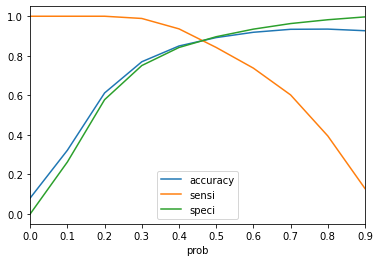

In [133]:
# finding cut-off with the right balance of the metrices
getOptimalModelThreshold(y_train_df)

**From the curve above, 0.45 is the optimal point with high enough sensitivity.**

In [134]:
cut_off_prob=0.45
predictChurnWithProb(random_forest_final,df_train_pca,y_train,cut_off_prob)

Roc_auc_score : 0.8810539871054699
Sensitivity/Recall : 0.8905972797161443
Specificity: 0.8715106944947951
False Positive Rate: 0.12848930550520482
Positive predictive value: 0.37772761474793076
Negative Predictive value: 0.9891259624992653
sklearn precision score value: 0.37772761474793076


,churn,churn_Prob,final_predicted
39186,0.0,0.391959,0
39833,0.0,0.247189,0
38778,0.0,0.157667,0
43026,0.0,0.170503,0
12271,0.0,0.125601,0
...,...,...,...
40261,0.0,0.205670,0
81456,0.0,0.137214,0
47136,0.0,0.732819,1
77825,0.0,0.460591,1


**Model Evaluation - Random Forest**

**Make predictions on test**

In [135]:
y_test_df= predictChurnWithProb(random_forest_final,df_test_pca,y_test,cut_off_prob)
y_test_df.head()

Roc_auc_score : 0.8175228861148143
Sensitivity/Recall : 0.7626666666666667
Specificity: 0.872379105562962
False Positive Rate: 0.12762089443703795
Positive predictive value: 0.352
Negative Predictive value: 0.9758676789587852
sklearn precision score value: 0.352


,churn,churn_Prob,final_predicted
20296,1.0,0.329259,0
8279,1.0,0.318565,0
72269,0.0,0.213406,0
65602,0.0,0.068031,0
42758,1.0,0.498486,1


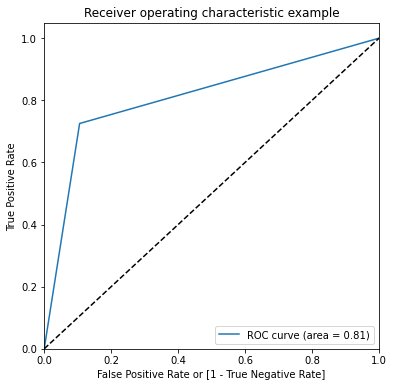

(array([0.        , 0.10580536, 1.        ]),
 array([0.        , 0.72533333, 1.        ]),
 array([2., 1., 0.]))

In [139]:
draw_roc(y_test, y_test_pred)

#### Random Forest model final results:

Train sensitivity : 89%, Train roc auc score : 88 %

Test sensitivity : 76%, Test roc auc score : 82%

### Model 3 - XG Boost with PCA

In [136]:
#Importing XG Boost libraries

from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics

import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance
import gc # for deleting unused variables
%matplotlib inline

In [137]:
df_train_pca.shape

(21000, 43)

In [138]:
# Fit model on PCA transformed training data with default hyperparameters
xgbm = XGBClassifier(class_weight="balanced", random_state=42)
fitModel_TrainModelEvaluationMetrics(xgbm, df_train_pca, y_train)


Model Report
Accuracy : 0.6419
Recall/Sensitivity : 0.2933
AUC Score (Train): 0.919765
CV Score : Mean - 0.8859449 | Std - 0.007693201 | Min - 0.8711263 | Max - 0.8931141


In [140]:
# make predictions for PCA transformed test data
# use predict_proba since we need probabilities to compute auc
y_pred = xgbm.predict_proba(df_test_pca)
y_pred[:10]

array([[0.90168136, 0.09831866],
       [0.95291686, 0.04708316],
       [0.9649078 , 0.03509218],
       [0.974071  , 0.025929  ],
       [0.8014924 , 0.19850762],
       [0.9769116 , 0.02308841],
       [0.97392505, 0.02607494],
       [0.9869004 , 0.01309962],
       [0.97702193, 0.02297805],
       [0.9858569 , 0.01414311]], dtype=float32)

In [141]:
# evaluate predictions
roc = metrics.roc_auc_score(y_test, y_pred[:, 1])
print("AUC: %.2f%%" % (roc * 100.0))

AUC: 88.85%


**The roc_auc in this case is about 89% with default hyperparameters.**<br>
**Let's now try tuning the hyperparameters using k-fold CV. We'll then use grid search CV to find the optimal values of hyperparameters.**

In [142]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = 3

# specify range of hyperparameters
param_grid = {'learning_rate': [.001,.01,0.1,0.2 ,0.6], 
             'subsample': [0.1,0.2,0.3, 0.6]}          

# specify model
xgbm2 = XGBClassifier(class_weight="balanced", random_state=42)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgbm2, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)

In [143]:
# fit the model
model_cv.fit(df_train_pca, y_train)     

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:  4.4min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     class_weight='balanced',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=42, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.6],
                         'subsam

In [144]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,2.696565,0.160172,0.048207,0.013401,0.001,0.1,"{'learning_rate': 0.001, 'subsample': 0.1}",0.834087,0.831788,0.839350,0.835075,0.003165,15,0.851036,0.854526,0.843130,0.849564,0.004768
1,3.427534,0.317785,0.038027,0.008176,0.001,0.2,"{'learning_rate': 0.001, 'subsample': 0.2}",0.826993,0.828038,0.844243,0.833090,0.007897,16,0.845803,0.850818,0.849513,0.848711,0.002124
2,3.791053,0.328438,0.037963,0.006634,0.001,0.3,"{'learning_rate': 0.001, 'subsample': 0.3}",0.829001,0.832095,0.844540,0.835211,0.006716,14,0.848116,0.854094,0.851766,0.851325,0.002460
3,5.741777,0.256789,0.045441,0.003155,0.001,0.6,"{'learning_rate': 0.001, 'subsample': 0.6}",0.820824,0.828942,0.839271,0.829678,0.007549,17,0.845166,0.850369,0.849568,0.848368,0.002288
4,2.609750,0.318632,0.042401,0.008792,0.01,0.1,"{'learning_rate': 0.01, 'subsample': 0.1}",0.846194,0.850653,0.859093,0.851980,0.005349,10,0.867091,0.871528,0.864505,0.867708,0.002900
5,3.263863,0.078218,0.041708,0.009128,0.01,0.2,"{'learning_rate': 0.01, 'subsample': 0.2}",0.846659,0.845282,0.862035,0.851324,0.007593,11,0.867941,0.866766,0.869411,0.868039,0.001082
6,4.155425,0.250469,0.040838,0.007449,0.01,0.3,"{'learning_rate': 0.01, 'subsample': 0.3}",0.845745,0.845077,0.859553,0.850124,0.006672,12,0.866483,0.867382,0.868439,0.867435,0.000799
7,6.307215,0.227519,0.055560,0.006848,0.01,0.6,"{'learning_rate': 0.01, 'subsample': 0.6}",0.835228,0.843396,0.855856,0.844826,0.008482,13,0.860913,0.867137,0.867325,0.865125,0.002980
8,2.807225,0.107992,0.044790,0.004237,0.1,0.1,"{'learning_rate': 0.1, 'subsample': 0.1}",0.880271,0.876907,0.885753,0.880977,0.003645,5,0.911748,0.912727,0.916227,0.913567,0.001923
9,3.683032,0.174107,0.049322,0.013024,0.1,0.2,"{'learning_rate': 0.1, 'subsample': 0.2}",0.879724,0.883498,0.888320,0.883847,0.003518,4,0.921286,0.920733,0.921585,0.921201,0.000353


In [145]:
# convert parameters to int for plotting on x-axis
cv_results['param_learning_rate'] = cv_results['param_learning_rate'].astype('float')
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,2.696565,0.160172,0.048207,0.013401,0.001,0.1,"{'learning_rate': 0.001, 'subsample': 0.1}",0.834087,0.831788,0.839350,0.835075,0.003165,15,0.851036,0.854526,0.843130,0.849564,0.004768
1,3.427534,0.317785,0.038027,0.008176,0.001,0.2,"{'learning_rate': 0.001, 'subsample': 0.2}",0.826993,0.828038,0.844243,0.833090,0.007897,16,0.845803,0.850818,0.849513,0.848711,0.002124
2,3.791053,0.328438,0.037963,0.006634,0.001,0.3,"{'learning_rate': 0.001, 'subsample': 0.3}",0.829001,0.832095,0.844540,0.835211,0.006716,14,0.848116,0.854094,0.851766,0.851325,0.002460
3,5.741777,0.256789,0.045441,0.003155,0.001,0.6,"{'learning_rate': 0.001, 'subsample': 0.6}",0.820824,0.828942,0.839271,0.829678,0.007549,17,0.845166,0.850369,0.849568,0.848368,0.002288
4,2.609750,0.318632,0.042401,0.008792,0.010,0.1,"{'learning_rate': 0.01, 'subsample': 0.1}",0.846194,0.850653,0.859093,0.851980,0.005349,10,0.867091,0.871528,0.864505,0.867708,0.002900


In [146]:
# printing the optimal accuracy score and hyperparameters
print('We can get a best ROC AUC of',model_cv.best_score_,'using',model_cv.best_params_)

We can get a best ROC AUC of 0.8867450827732308 using {'learning_rate': 0.1, 'subsample': 0.3}


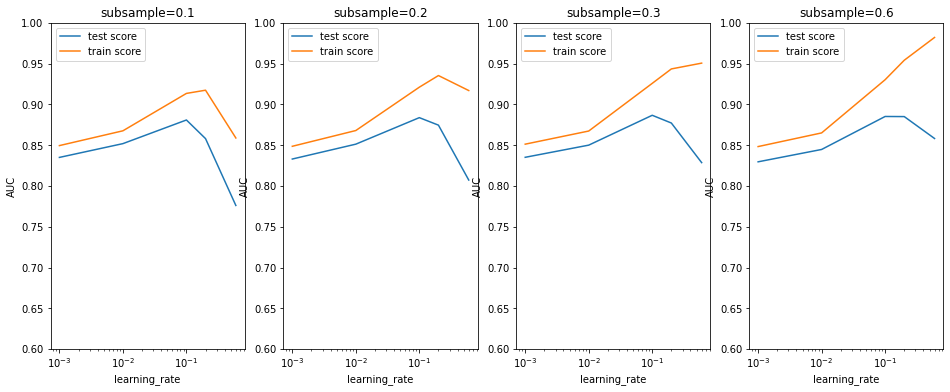

In [147]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [.001,.01,0.1,0.2 ,0.6], 
             'subsample': [0.1,0.2,0.3, 0.6]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

**The results show that a subsample size of 0.3 and learning_rate of about 0.1 seems optimal. Also, XGBoost has resulted in the highest ROC AUC obtained (across various hyperparameters). **<br>


**Let's build a final model with the chosen hyperparameters.**

In [148]:
# chosen hyperparameters
# 'objective':'binary:logistic' outputs probability rather than label, which we need for auc
params = {'learning_rate': 0.1,
          'subsample':0.3,
         'objective':'binary:logistic'}

# fit model on training data
xgbm_final = XGBClassifier(params = params,class_weight="balanced", random_state=42)
fitModel_TrainModelEvaluationMetrics(xgbm_final, df_train_pca, y_train)


Model Report
Accuracy : 0.6419
Recall/Sensitivity : 0.2933
AUC Score (Train): 0.919765
CV Score : Mean - 0.8859449 | Std - 0.007693201 | Min - 0.8711263 | Max - 0.8931141


In [149]:
y_test_pred = xgbm_final.predict(df_test_pca)
getTestModelEvaluationMetrics(y_test,y_test_pred)   

Roc_auc_score : 0.618000969579445
Sensitivity/Recall : 0.252
Specificity: 0.9840019391588898
False Positive Rate: 0.01599806084111017
Positive predictive value: 0.5887850467289719
Negative Predictive value: 0.93536866359447
sklearn precision score value: 0.5887850467289719


In [150]:
# predicting churn with default cut-off 0.5
cut_off_prob=0.5
y_train_df = predictChurnWithProb(xgbm_final,df_train_pca,y_train,cut_off_prob)
y_train_df.head()

Roc_auc_score : 0.6418682695895404
Sensitivity/Recall : 0.29331756357185096
Specificity: 0.9904189756072298
False Positive Rate: 0.009581024392770211
Positive predictive value: 0.7283406754772394
Negative Predictive value: 0.941188050593041
sklearn precision score value: 0.7283406754772394


,churn,churn_Prob,final_predicted
39186,0.0,0.082007,0
39833,0.0,0.045661,0
38778,0.0,0.036280,0
43026,0.0,0.019382,0
12271,0.0,0.012456,0


     prob  accuracy     sensi     speci
0.0   0.0  0.080524  1.000000  0.000000
0.1   0.1  0.857095  0.822590  0.860117
0.2   0.2  0.913571  0.714962  0.930965
0.3   0.3  0.932190  0.588409  0.962297
0.4   0.4  0.935857  0.435245  0.979699
0.5   0.5  0.934286  0.293318  0.990419
0.6   0.6  0.927048  0.123596  0.997411
0.7   0.7  0.921333  0.025429  0.999793
0.8   0.8  0.919524  0.000591  1.000000
0.9   0.9  0.919476  0.000000  1.000000


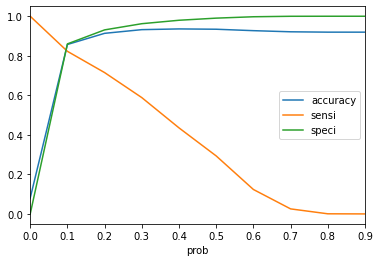

In [152]:
# finding cut-off with the right balance of the metrices
getOptimalModelThreshold(y_train_df)

In [164]:
# Selecting 0.1 as cut-off in an attempt to improve recall rate 
#and get right balance between specificity, accuracy and sensitivity.
cut_off_prob=0.1
predictChurnWithProb(xgbm_final,df_train_pca,y_train,cut_off_prob)

Roc_auc_score : 0.8413536135945161
Sensitivity/Recall : 0.8225901833234772
Specificity: 0.8601170438655549
False Positive Rate: 0.13988295613444507
Positive predictive value: 0.3399315738025415
Negative Predictive value: 0.9822569198012775
sklearn precision score value: 0.3399315738025415


,churn,churn_Prob,final_predicted
39186,0.0,0.082007,0
39833,0.0,0.045661,0
38778,0.0,0.036280,0
43026,0.0,0.019382,0
12271,0.0,0.012456,0
...,...,...,...
40261,0.0,0.016613,0
81456,0.0,0.023501,0
47136,0.0,0.215533,1
77825,0.0,0.088909,0


In [165]:
y_test_df= predictChurnWithProb(xgbm_final,df_test_pca,y_test,cut_off_prob)
y_test_df.head()

Roc_auc_score : 0.8155842928129924
Sensitivity/Recall : 0.772
Specificity: 0.8591685856259847
False Positive Rate: 0.14083141437401528
Positive predictive value: 0.3325674899483056
Negative Predictive value: 0.9764462809917356
sklearn precision score value: 0.3325674899483056


,churn,churn_Prob,final_predicted
20296,1.0,0.098319,0
8279,1.0,0.047083,0
72269,0.0,0.035092,0
65602,0.0,0.025929,0
42758,1.0,0.198508,1


#### XG Boost model final results:

Train sensitivity : 82%, Train roc auc score : 84 %

Test sensitivity : 77%, Test roc auc score : 82%

### Intepretable model (without PCA)

We also need to find out which are the most important features of the dataset to help predict customer churn ,we have decided to use an instance of Random Forrest for this.


### Random Forrest

In [166]:
# Create the parameter grid 
param_grid = {
    'max_depth': [10],
    'min_samples_leaf': range(50, 200,50),
    'min_samples_split': range(50, 150, 50),
    'n_estimators': [75,100, 125], 
    'max_features': [12, 15, 20]
}
# Create a based model
rf = RandomForestClassifier(class_weight="balanced",random_state=42)
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = 4,verbose = 1)


In [167]:

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 54 candidates, totalling 162 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:  2.0min
[Parallel(n_jobs=4)]: Done 162 out of 162 | elapsed:  6.7min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=42,
                                              verbose=0, warm_start=False),
            

In [168]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9026190476190477 using {'max_depth': 10, 'max_features': 12, 'min_samples_leaf': 50, 'min_samples_split': 50, 'n_estimators': 125}


In [169]:
rf_interpretable = RandomForestClassifier(max_depth=10,
                            max_features=15,
                            min_samples_leaf=50,
                            min_samples_split=50,
                            n_estimators=125,
                            random_state=42,class_weight='balanced')

rf_interpretable.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=10, max_features=15,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=50,
                       min_samples_split=50, min_weight_fraction_leaf=0.0,
                       n_estimators=125, n_jobs=None, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

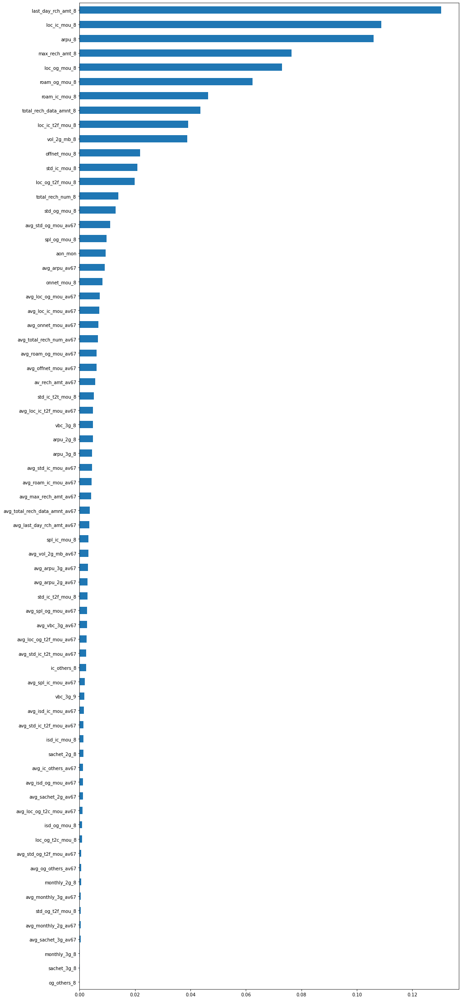

In [170]:
plt.figure(figsize=(15,40))
feat_importances = pd.Series(rf_interpretable.feature_importances_, index=X.columns)
feat_importances.nlargest(len(X.columns)).sort_values().plot(kind='barh', align='center')

### The top 10 features as per the above graph are  :

     1.last_day_rch_amt_8 -- last day recharge amount in month 8
     2.loc_ic_mou_8 -- local incoming minutes of usage in month 8
     3.arpu_8 -- average revenue per user in month 8
     4.max_rech_amt_8 -- maximum recharge amount in month 8
     5.roam_og_mou_8 -- outgoing roaming calls minutes of usage in month 8
     6.loc_og_mou_8 -- local outgoing calls minutes of usage in month 8
     7.roam_ic_mou_8 -- incoming roaming calls minutes of usage in month 8
     8.total_rech_data_amnt_8 -- total recharge amount for data in month 8
     9.vol_2g_mb_8 -- 2G mobile internet usage volume (in MB) in month 8
     10.loc_ic_t2f_mou_8 -- local incoming calls from fixed lines of same network minutes of usage in month 8

## Model Evaluation Summary

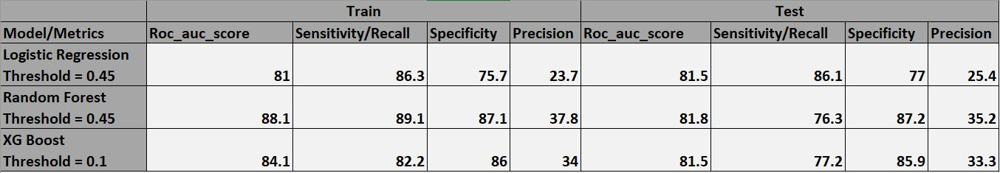

### Final Choice of Model
Sensitivity or Recall is the most important business metric for the telecom churn problem. The company would like to identify most customers at risk of churning, even if there are many customers that are misclassified as churn. The cost to the company of churning is much higher than having a few false positives.

To that end **Logistic Regression** seems to be the best fit to answer the business question at hand i.e which customers are likely to churn ,since it is having a Sensitivity/Recall of 86% which is the highest of the three models built . Also since training and test results are almost same which means it is not overfitting/underfitting.

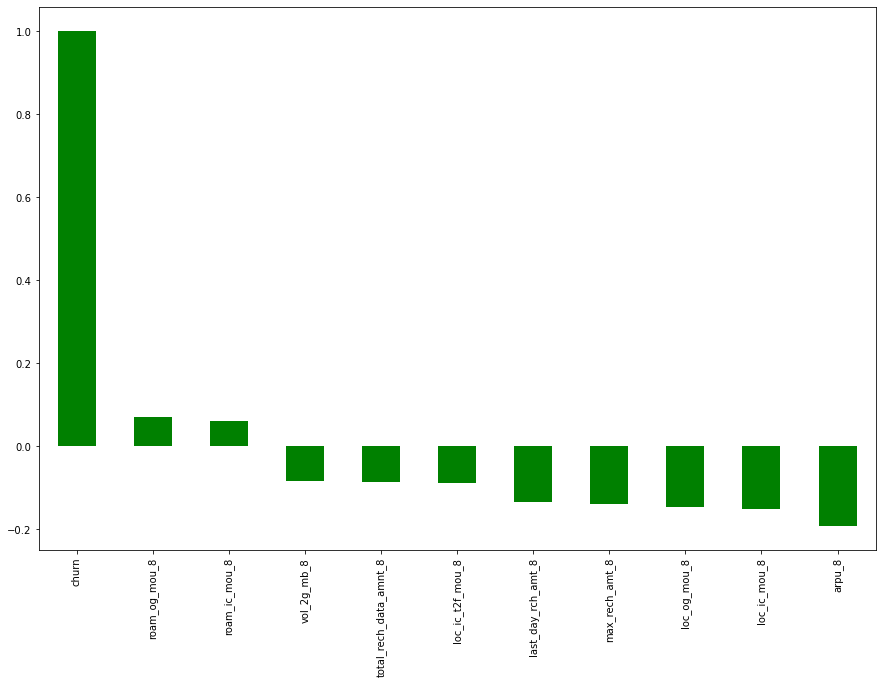

In [171]:
#Get Correlation of "Churn" with other variables:
plt.figure(figsize=(15,10))
imp_feat_df=teldata_high_value[['last_day_rch_amt_8','arpu_8','loc_ic_mou_8','max_rech_amt_8','roam_og_mou_8','loc_og_mou_8','roam_ic_mou_8','total_rech_data_amnt_8','vol_2g_mb_8','loc_ic_t2f_mou_8','churn']]
imp_feat_df.corr()['churn'].sort_values(ascending = False).plot(kind='bar',color='g')

#### The correlation graph of the top 10 features with churn tells us that :

   1.Metrics like **roam_og_mou_8** and **roam_ic_mou_8** are both positivly correlated with churn i.e if the roaming usage          increases for month 8 then the customer may churn .
   
   2.Rest all metrics for the month 8 are negatively correlated i.e. any decline in them is a possible sign of customer             churn .

## Recommendations to prevent customer churn
**What we see is that all the important features are related to the month 8 i.e. the 'Action phase' thus ;**

1. Customers showing sudden increase in action month for roaming services (outgoing and incoming) should be reached out and given one or more offers like:
    - Better roaming plans
    - Improved network on roaming
2. Monitor average revenue generated from each customers on weekly basis in action phase and if any drop in revenue is observed, customers should be reached out personally and asked for feedback.
3. If there is a sudden drop in usage of outgoing and incoming calls for specific customers, they can be given one or more offers like:
    - Better incoming and outgoing plans
    - Discounts
    - Incoming and outgoing packages for a longer duration.
4. If there is a sudden drop in maximum recharge amount for specific customers,they should be contacted and asked for concerns they may have.
5. If there is a drop in last day recharge amount in action phase, they can be offered discounts or long duration packages.
6. If there is a drop in total recharge data amount in action phase, they can be offered discounts or long duration packages.